# Importing necessary Modules

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
import seaborn as sns

In [ ]:
from sklearn import preprocessing

In [ ]:
from scipy.stats import norm, probplot

In [ ]:
from copy import copy

In [ ]:
from sklearn.feature_selection import VarianceThreshold

In [ ]:
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.datasets import make_regression

In [ ]:
from tabulate import tabulate

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint

# Initializing the dataset and .names file

In [ ]:
df = pd.read_csv("OnlineNewsPopularity.csv")
with open("OnlineNewsPopularity.names") as f:
    print(f.read())

1. Title: Online News Popularity

2. Source Information
    -- Creators: Kelwin Fernandes (kafc ‘@’ inesctec.pt, kelwinfc ’@’ gmail.com),
                 Pedro Vinagre (pedro.vinagre.sousa ’@’ gmail.com) and
                 Pedro Sernadela
   -- Donor: Kelwin Fernandes (kafc ’@’ inesctec.pt, kelwinfc '@' gmail.com)
   -- Date: May, 2015

3. Past Usage:
    1. K. Fernandes, P. Vinagre and P. Cortez. A Proactive Intelligent Decision
       Support System for Predicting the Popularity of Online News. Proceedings
       of the 17th EPIA 2015 - Portuguese Conference on Artificial Intelligence,
       September, Coimbra, Portugal.

       -- Results: 
          -- Binary classification as popular vs unpopular using a decision
             threshold of 1400 social interactions.
          -- Experiments with different models: Random Forest (best model),
             Adaboost, SVM, KNN and Naïve Bayes.
          -- Recorded 67% of accuracy and 0.73 of AUC.
    - Predicted attribute: online ne

# Basic Information of Dataset

In [ ]:
df.columns

Index([' url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sen

In [ ]:
#Removing Space Character from Feature names
df.columns=df.columns.str.replace(" ","")

In [ ]:
df.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731,12,219,0.663594,1.0,0.815385,4,2,1,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731,9,255,0.604743,1.0,0.791946,3,1,1,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731,9,211,0.575130,1.0,0.663866,3,1,1,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731,9,531,0.503788,1.0,0.665635,9,0,1,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731,13,1072,0.415646,1.0,0.540890,19,19,20,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [ ]:
df.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,...,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184
std,214.163767,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,...,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000
25%,164.000000,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,...,0.050000,0.600000,-0.328383,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,946.000000
50%,339.000000,10.000000,409.000000,0.539226,1.000000,0.690476,8.000000,3.000000,1.000000,0.000000,...,0.100000,0.800000,-0.253333,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,1400.000000
75%,542.000000,12.000000,716.000000,0.608696,1.000000,0.754630,14.000000,4.000000,4.000000,1.000000,...,0.100000,1.000000,-0.186905,-0.300000,-0.050000,0.500000,0.150000,0.500000,0.250000,2800.000000
max,731.000000,23.000000,8474.000000,701.000000,1042.000000,650.000000,304.000000,116.000000,128.000000,91.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,843300.000000


From above description we can clearly see that this data needs to be normalized so that we can apply ML models for greater precision and accuracy

In [ ]:
df.shape

(39644, 61)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   url                            39644 non-null  object 
 1   timedelta                      39644 non-null  int64  
 2   n_tokens_title                 39644 non-null  int64  
 3   n_tokens_content               39644 non-null  int64  
 4   n_unique_tokens                39644 non-null  float64
 5   n_non_stop_words               39644 non-null  float64
 6   n_non_stop_unique_tokens       39644 non-null  float64
 7   num_hrefs                      39644 non-null  int64  
 8   num_self_hrefs                 39644 non-null  int64  
 9   num_imgs                       39644 non-null  int64  
 10  num_videos                     39644 non-null  int64  
 11  average_token_length           39644 non-null  float64
 12  num_keywords                   39644 non-null 

In [ ]:
# Checking for any null values and displaying total null values(if any) per columns
df.isna().sum()

url                             0
timedelta                       0
n_tokens_title                  0
n_tokens_content                0
n_unique_tokens                 0
                               ..
title_subjectivity              0
title_sentiment_polarity        0
abs_title_subjectivity          0
abs_title_sentiment_polarity    0
shares                          0
Length: 61, dtype: int64

In [ ]:
# Checking for any duplicates from the dataset
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
39639    False
39640    False
39641    False
39642    False
39643    False
Length: 39644, dtype: bool

In [ ]:
df.dtypes

url                              object
timedelta                         int64
n_tokens_title                    int64
n_tokens_content                  int64
n_unique_tokens                 float64
                                 ...   
title_subjectivity              float64
title_sentiment_polarity        float64
abs_title_subjectivity          float64
abs_title_sentiment_polarity    float64
shares                            int64
Length: 61, dtype: object

# Data Processing

In [ ]:
correlation_matrix = df.corr()
print(correlation_matrix)

                               timedelta  n_tokens_title  n_tokens_content  \
timedelta                       1.000000       -0.240320         -0.062867   
n_tokens_title                 -0.240320        1.000000          0.018160   
n_tokens_content               -0.062867        0.018160          1.000000   
n_unique_tokens                 0.002866       -0.005318         -0.004737   
n_non_stop_words                0.000089       -0.004754          0.017512   
n_non_stop_unique_tokens        0.003805       -0.005420          0.000373   
num_hrefs                      -0.000832       -0.053496          0.423065   
num_self_hrefs                  0.064530       -0.014856          0.304682   
num_imgs                       -0.027636       -0.008858          0.342600   
num_videos                      0.000936        0.051460          0.103699   
average_token_length            0.130465       -0.071403          0.167789   
num_keywords                    0.046884       -0.006077        

As we can see in OnlineNewsPopularity.names file we can see different columns for different days of the week as well as different data channels which is not necessary. We can have columns for data channel and weekdays which could display all the info. This will reduce the dimension and the improve the interpretation

In [ ]:
# Merging the weekdays columns channels as one single column
publishdayMerge=df[['weekday_is_monday','weekday_is_tuesday','weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday','weekday_is_saturday' ,'weekday_is_sunday' ]]

weekday_arr=[]
for row in list(range(publishdayMerge.shape[0])):
    for col in list(range(publishdayMerge.shape[1])):
        if ((col==0) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Monday')
        elif ((col==1) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Tueday')
        elif ((col==2) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Wednesday')
        elif ((col==3) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Thursday')
        elif ((col==4) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Friday')
        elif ((col==5) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Saturday')
        elif ((col==6) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Sunday')

In [ ]:
# Merging the data channels as one single column
DataChannelMerge=df[['data_channel_is_lifestyle','data_channel_is_entertainment' ,'data_channel_is_bus','data_channel_is_socmed' ,'data_channel_is_tech','data_channel_is_world' ]]

DataChannel_arr=[]
for row in list(range(DataChannelMerge.shape[0])):
    if (((DataChannelMerge.iloc[row,0])==0) and ((DataChannelMerge.iloc[row,1])==0) and ((DataChannelMerge.iloc[row,2])==0) and ((DataChannelMerge.iloc[row,3])==0) and ((DataChannelMerge.iloc[row,4])==0) and ((DataChannelMerge.iloc[row,5])==0)):
        DataChannel_arr.append('Others')
    for col in list(range(DataChannelMerge.shape[1])):
        if ((col==0) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Lifestyle')
        elif ((col==1) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Entertainment')
        elif ((col==2) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Business')
        elif ((col==3) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Social Media')
        elif ((col==4) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Tech')
        elif ((col==5) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('World')

In [ ]:
# merge the the new data into the dataframe
df.insert(loc=11, column='weekdays', value=weekday_arr)
df.insert(loc=12, column='data_channel', value=DataChannel_arr)

print(df.shape)
df.head()

(39644, 63)


,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731,12,219,0.663594,1.0,0.815385,4,2,1,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731,9,255,0.604743,1.0,0.791946,3,1,1,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731,9,211,0.575130,1.0,0.663866,3,1,1,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731,9,531,0.503788,1.0,0.665635,9,0,1,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731,13,1072,0.415646,1.0,0.540890,19,19,20,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [ ]:
df.columns

Index(['url', 'timedelta', 'n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos', 'weekdays',
       'data_channel', 'average_token_length', 'num_keywords',
       'data_channel_is_lifestyle', 'data_channel_is_entertainment',
       'data_channel_is_bus', 'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global

In [ ]:
df.shape

(39644, 63)

In [ ]:
df['n_tokens_content'].describe()

count    39644.000000
mean       546.514731
std        471.107508
min          0.000000
25%        246.000000
50%        409.000000
75%        716.000000
max       8474.000000
Name: n_tokens_content, dtype: float64

From what we can infer from the OnlineNewsPopularity.names file, n_tokens_contents contains the number of words in the article but as we can see above the min value is 0. If n_tokens_contents is 0 then the article doesnt contain any words and hence we can call these rows as noise. This would not help in prediction of popularity as it doesnt bring any info for it. So, we remove the rows.

In [ ]:
words = df[df['n_tokens_content'] == 0].index
print('Articles with no words in it:-', words.size)

Articles with no words in it:- 1181


In total 1181 articles have no words and could be removed to reduce noise

In [ ]:
df.drop(words, inplace=True)
df.shape

(38463, 63)

C:\Users\HP\AppData\Local\Temp\ipykernel_9376\1371974247.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_lt = cor.where(np.tril(np.ones(cor.shape)).astype(np.bool))


<AxesSubplot:>

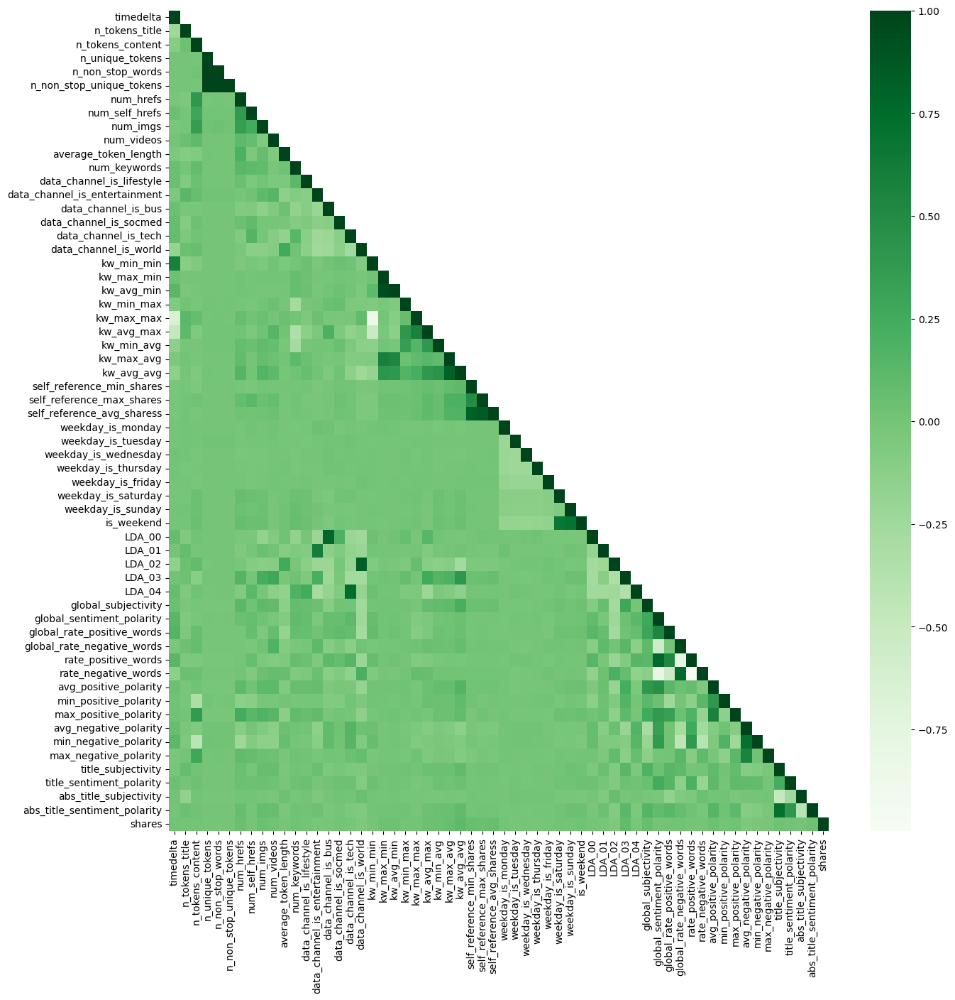

In [ ]:
cor=df.corr()
plt.figure(figsize=(15,15))
df_lt = cor.where(np.tril(np.ones(cor.shape)).astype(np.bool))
sns.heatmap(df_lt,cmap='Greens')

Also from the OnlineNewsPopularity.names we can see that url and timedelta do not contribute in final prediction because url contains the website link and as all the articles are from the same website this field is considered as noise. In the case of timedelta, it represents the gap of days between the publication of article to formation of dataset.

In [ ]:
df = df.drop(['url','timedelta'], axis=1)

In [ ]:
# Drop highly correlated attributes "n_non_stop_unique_tokens","n_non_stop_words","kw_avg_min" as they dont
# bring anything in prediction but increase the complexity
df= df.drop(["n_non_stop_unique_tokens","n_non_stop_words","kw_avg_min"],axis=1)

<h3>Basic Understanding of target variable

In [ ]:
share_data = df['shares']
df['shares'].describe()

count     38463.000000
mean       3355.360398
std       11585.968776
min           1.000000
25%         945.000000
50%        1400.000000
75%        2700.000000
max      843300.000000
Name: shares, dtype: float64

Here we convert the share variable into popularity variable by converting through the ranges using the percentiles from the describe function
<li>greater than 75 percentile - "High"
<li>between 50 to 75 percentile - "Good"
<li>between 25 to 50 percentile - "Average"
<li>less than 25 percentile - "Low"
<br><br>The above is done just for visualization purposes which is done by its class as of whole. This column will not be used in final prediction.

In [ ]:
share_label = list()
for share in share_data:
    if share <= 945:
        share_label.append('Low')
    elif share > 945 and share <= 1400:
        share_label.append('Average')
    elif share > 1400 and share <= 2700:
        share_label.append('Good')
    else:
        share_label.append('High')

df = pd.concat([df, pd.DataFrame(share_label, columns=['popularity'])], axis=1)

In [ ]:
df.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,weekdays,data_channel,average_token_length,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity
0,12.0,219.0,0.663594,4.0,2.0,1.0,0.0,Monday,Entertainment,4.680365,...,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593.0,Low
1,9.0,255.0,0.604743,3.0,1.0,1.0,0.0,Monday,Business,4.913725,...,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711.0,Low
2,9.0,211.0,0.575130,3.0,1.0,1.0,0.0,Monday,Business,4.393365,...,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500.0,Good
3,9.0,531.0,0.503788,9.0,0.0,1.0,0.0,Monday,Entertainment,4.404896,...,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200.0,Average
4,13.0,1072.0,0.415646,19.0,19.0,20.0,0.0,Monday,Tech,4.682836,...,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505.0,Low


In [ ]:
df.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'weekdays', 'data_channel',
       'average_token_length', 'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_min_max',
       'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg',
       'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
      

# Outlier Handling

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


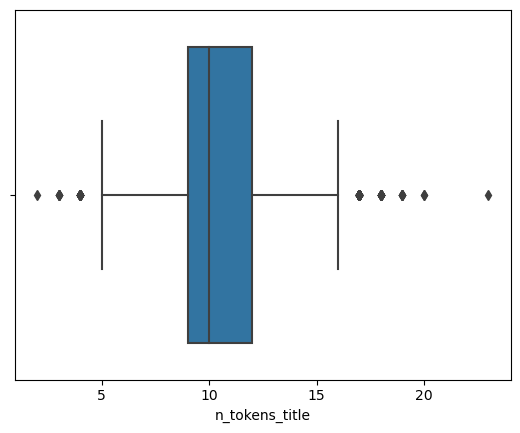

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


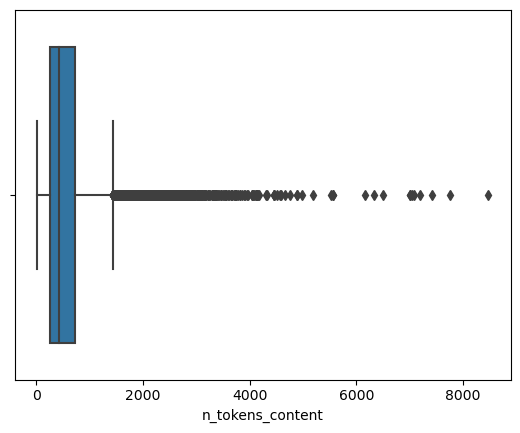

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


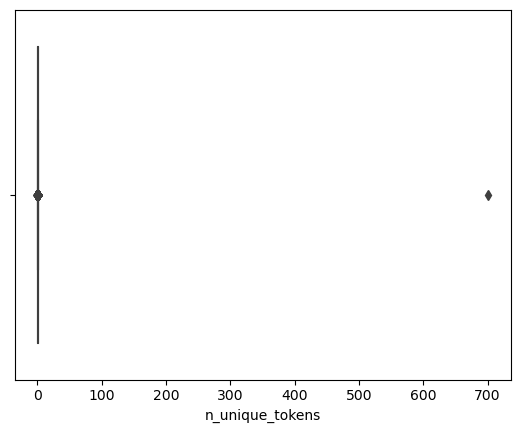

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


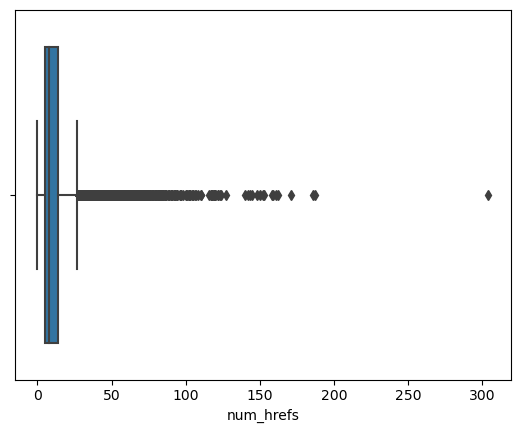

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


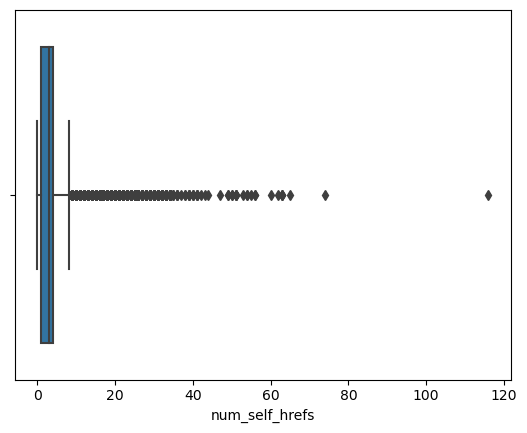

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


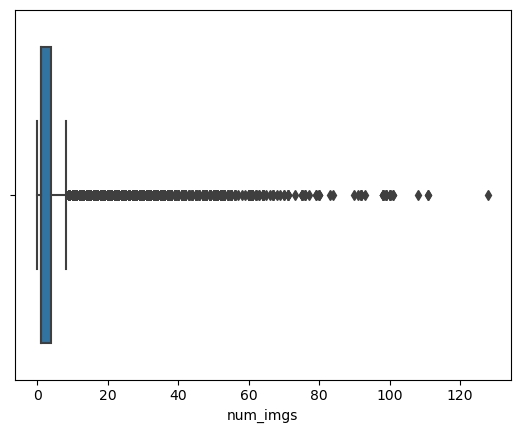

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


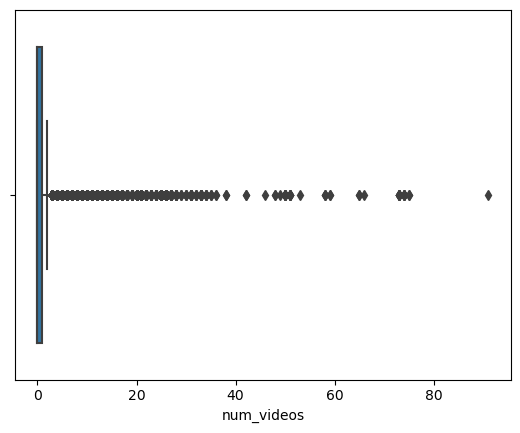

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


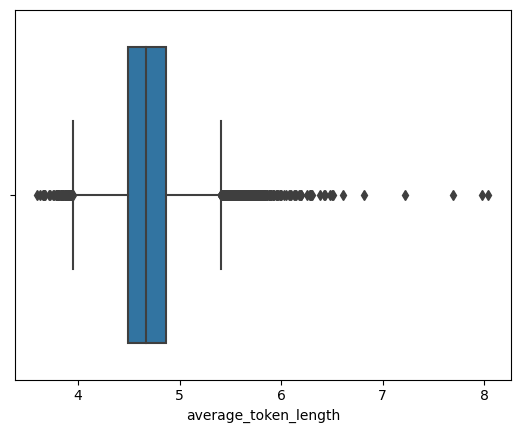

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


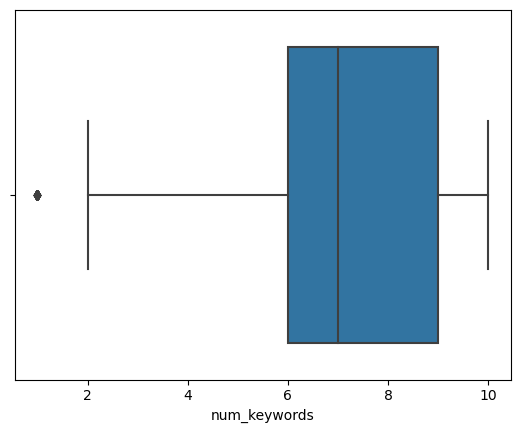

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


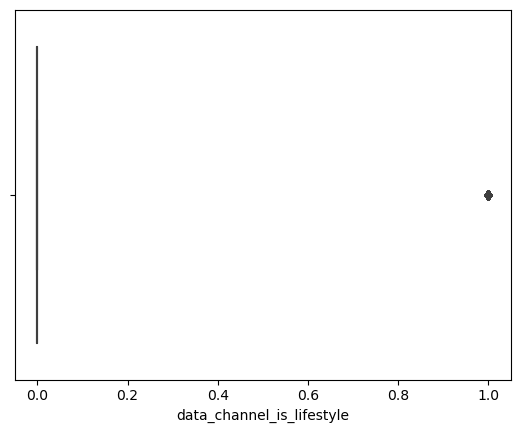

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


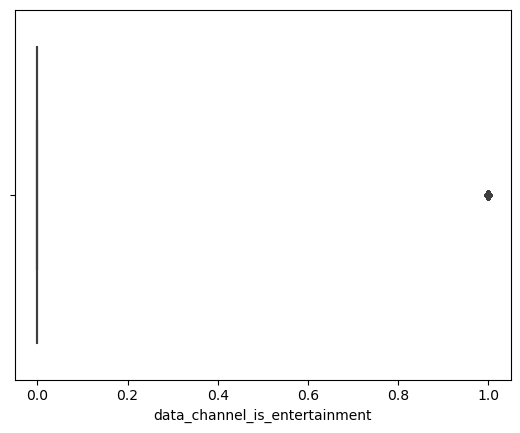

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


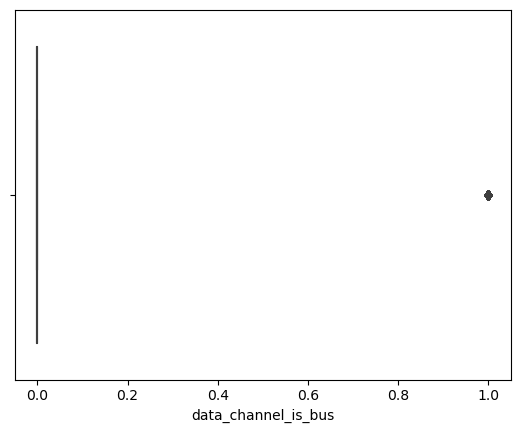

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


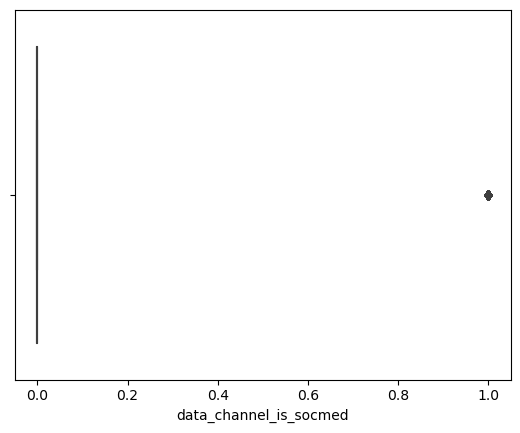

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


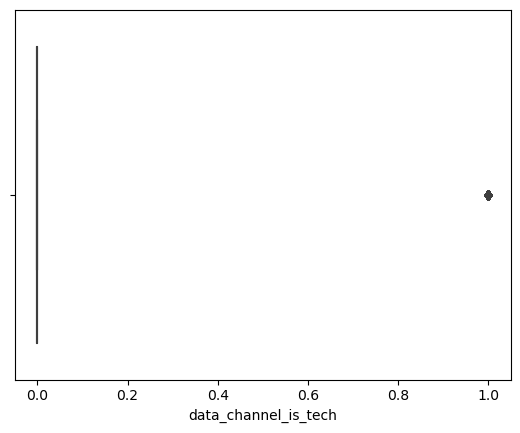

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


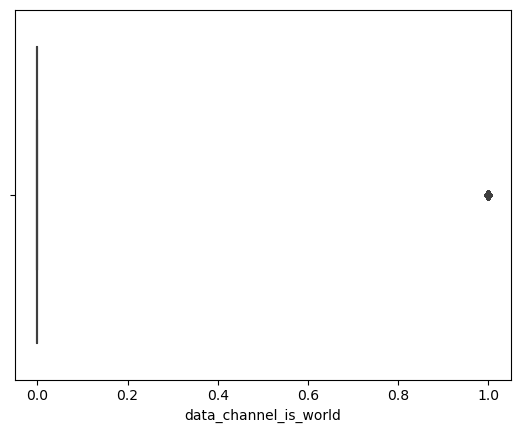

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


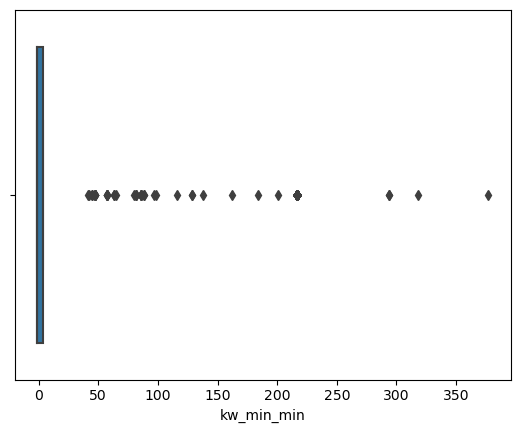

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


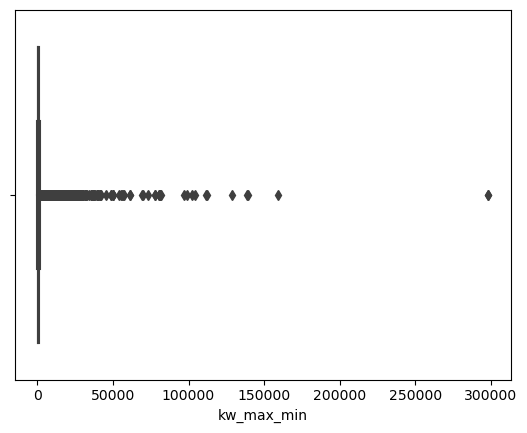

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


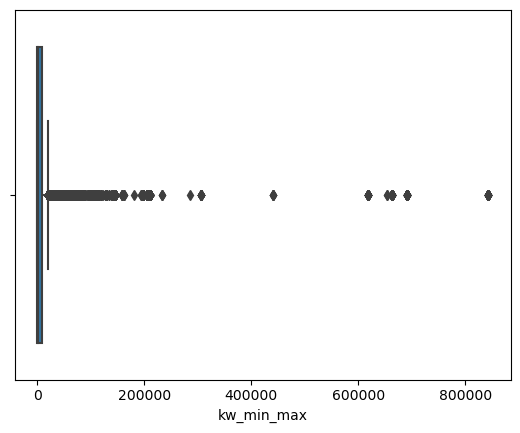

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


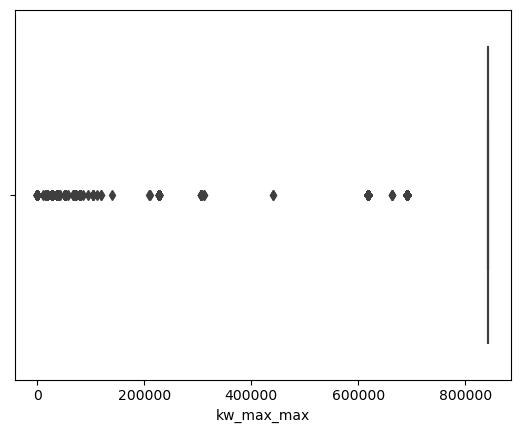

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


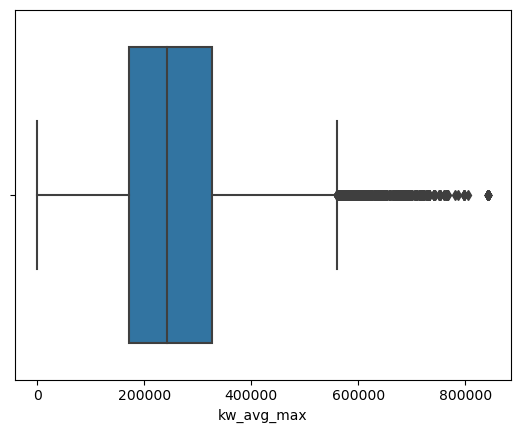

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


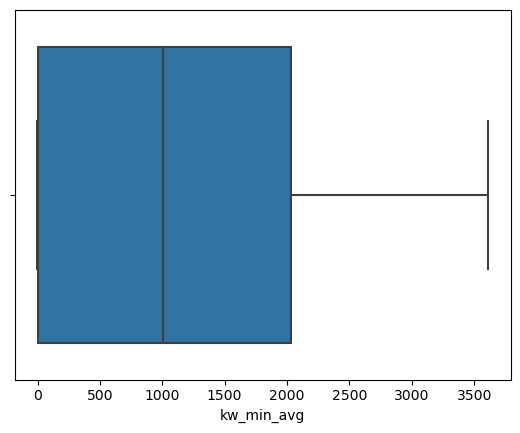

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


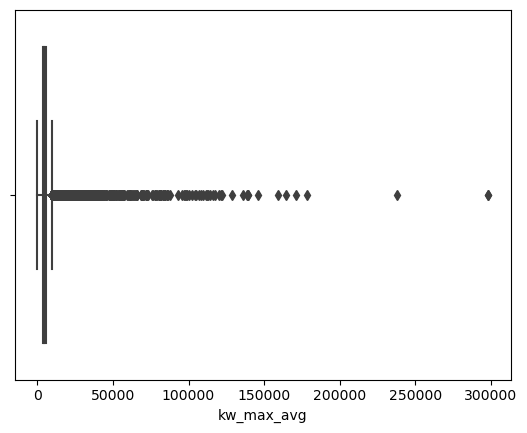

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


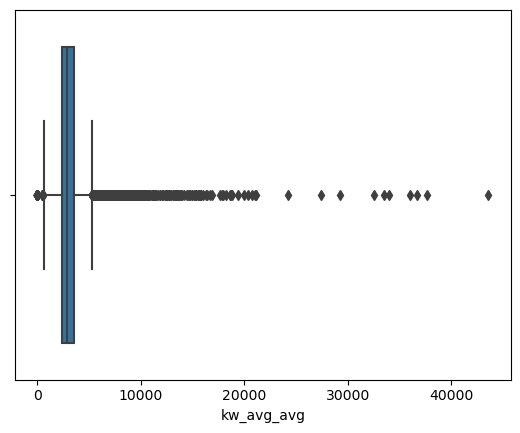

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


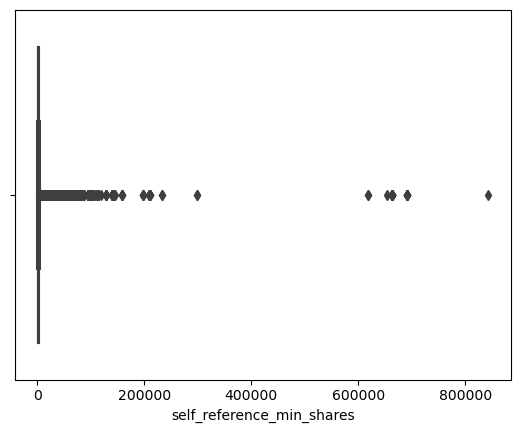

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


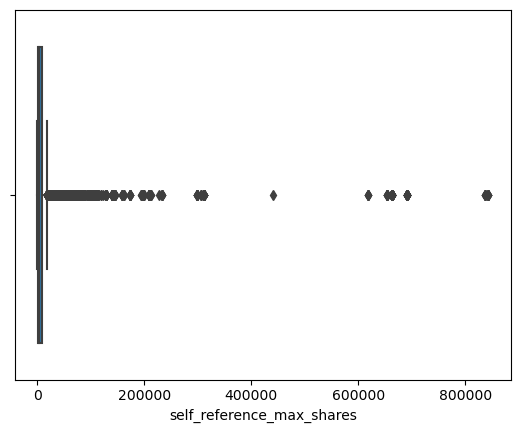

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


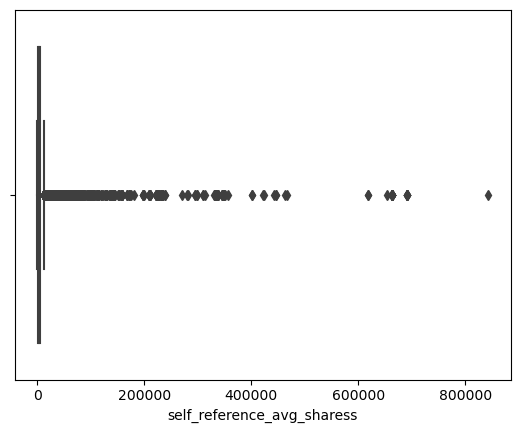

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


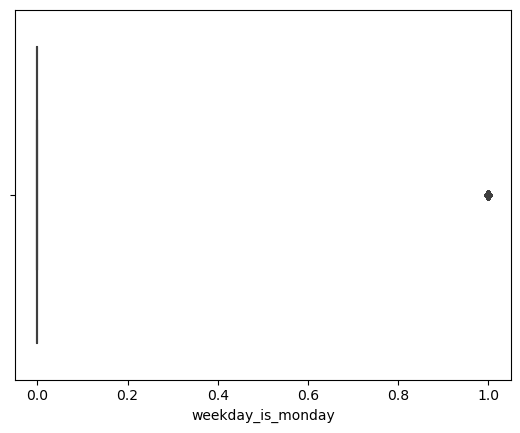

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


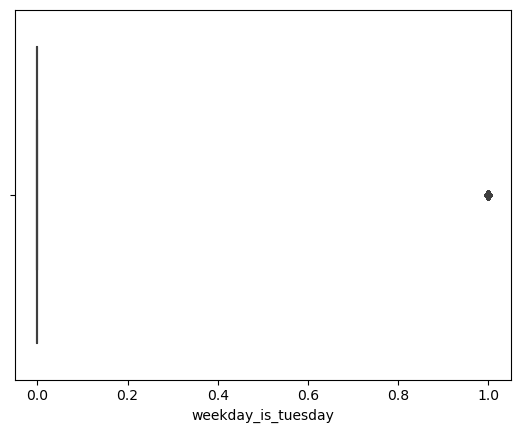

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


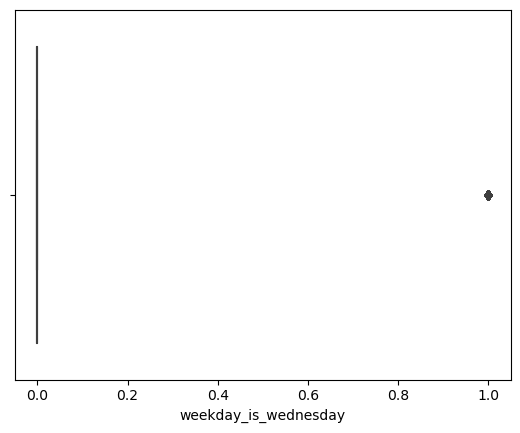

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


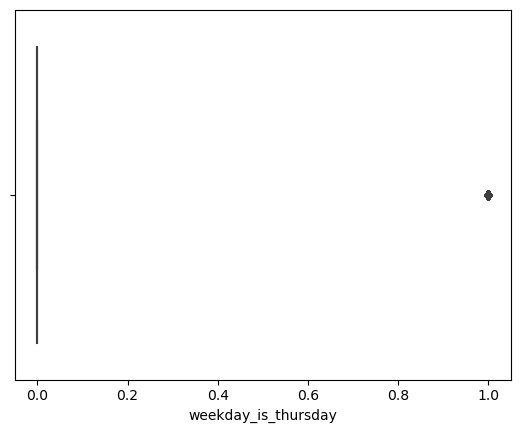

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


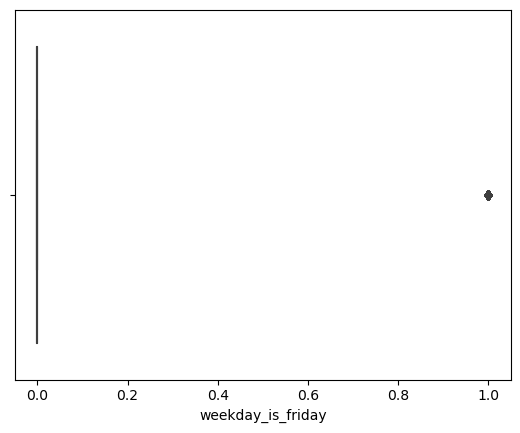

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


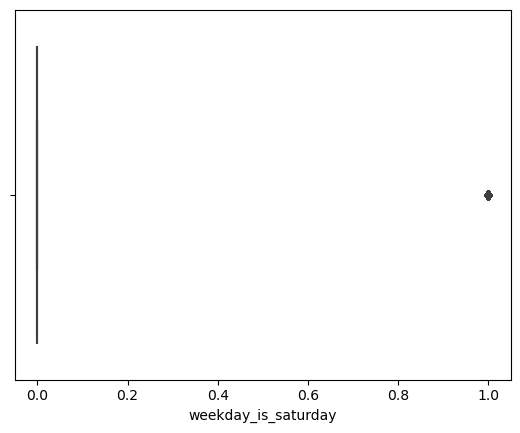

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


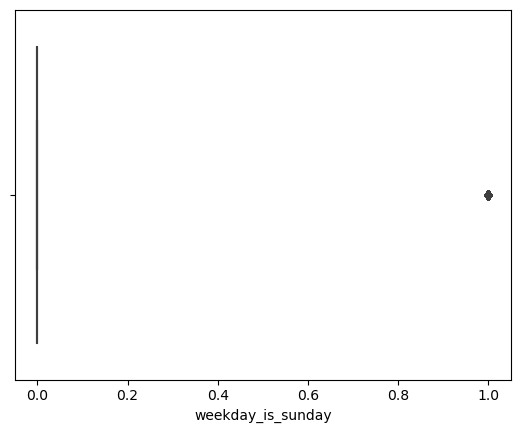

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


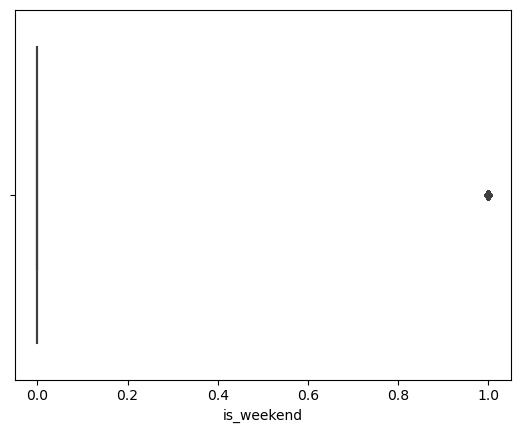

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


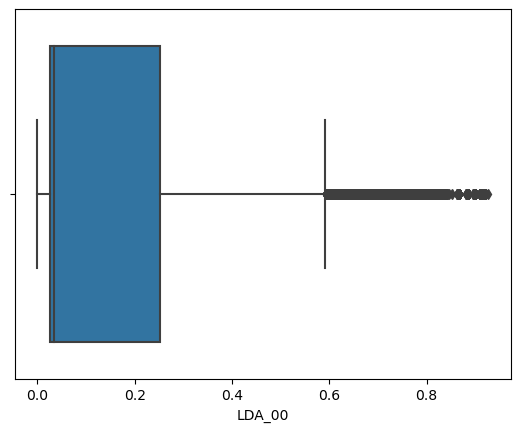

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


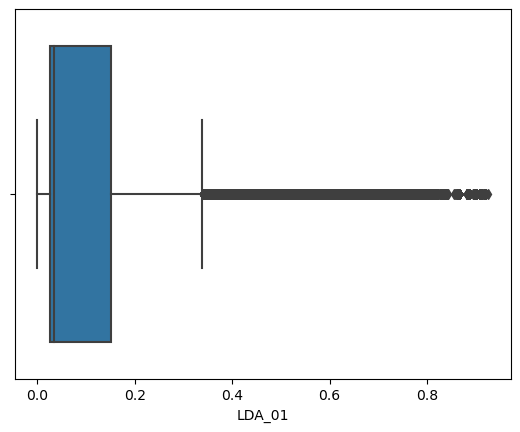

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


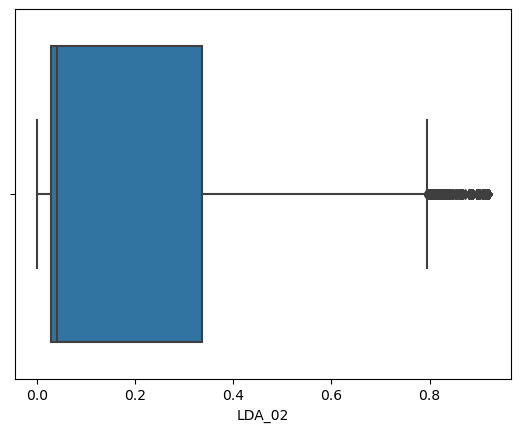

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


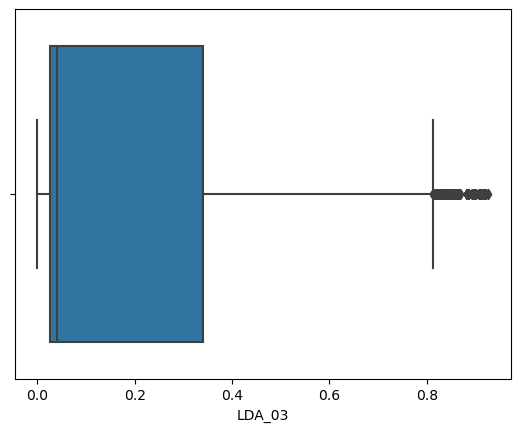

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


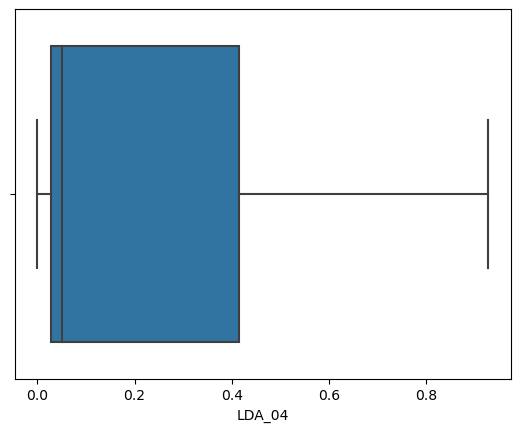

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


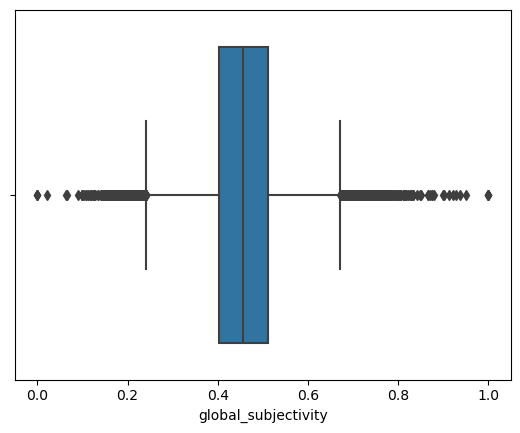

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


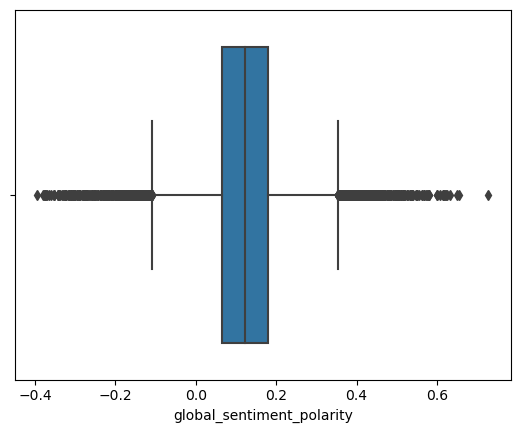

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


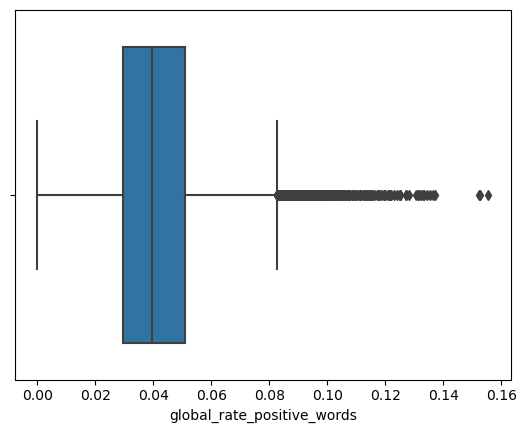

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


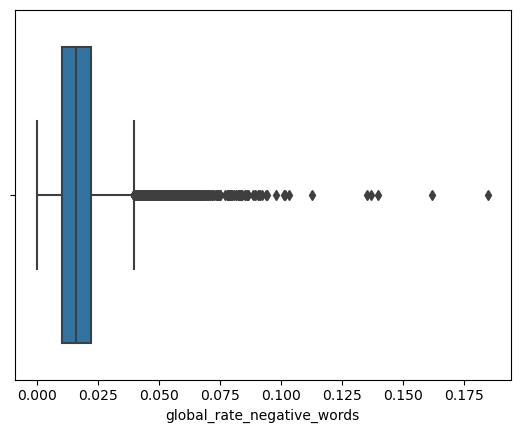

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


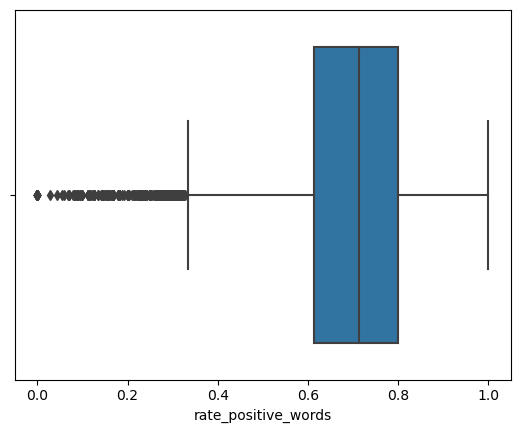

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


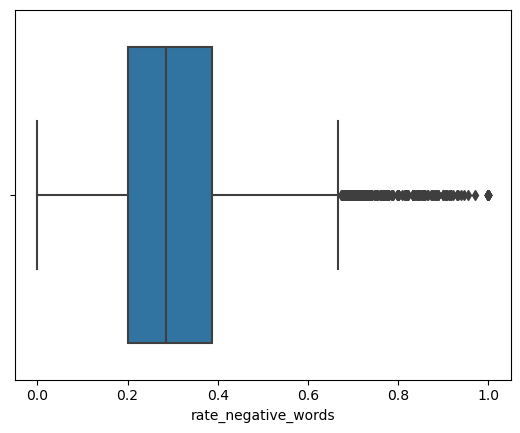

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


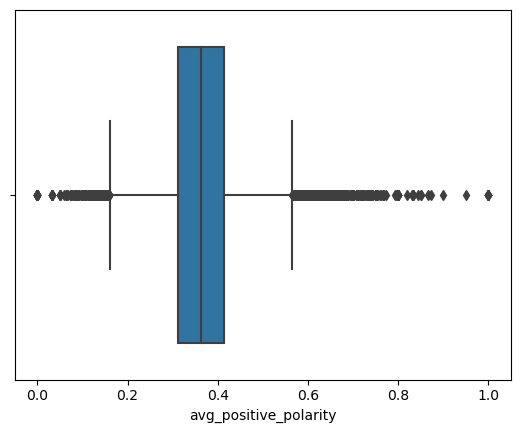

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


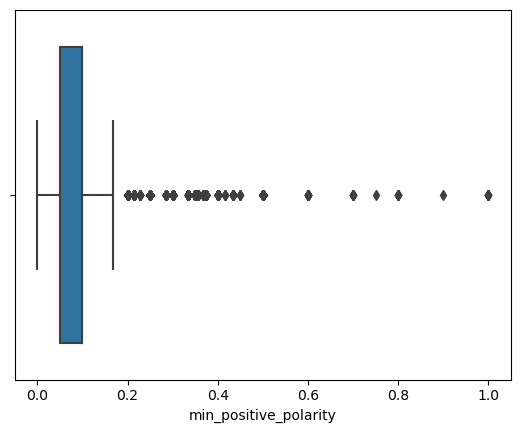

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


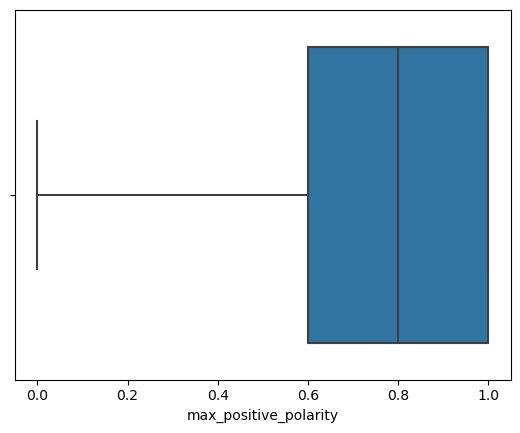

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


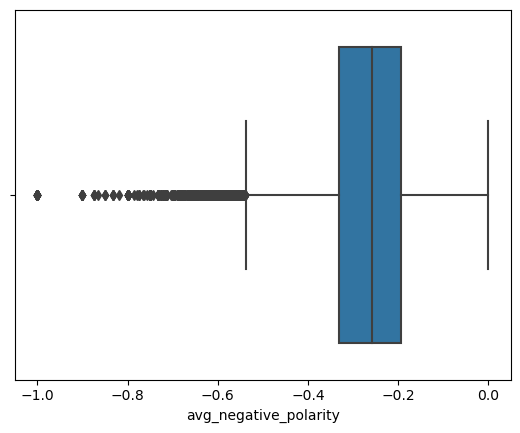

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


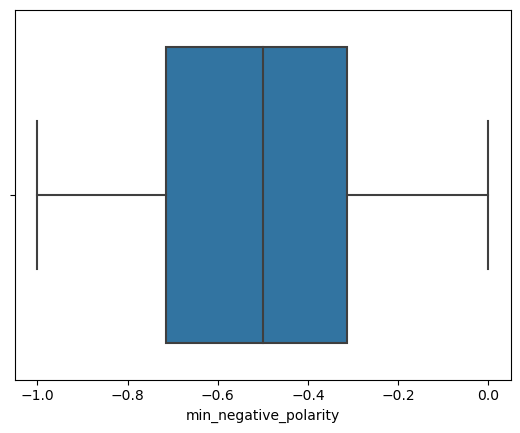

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


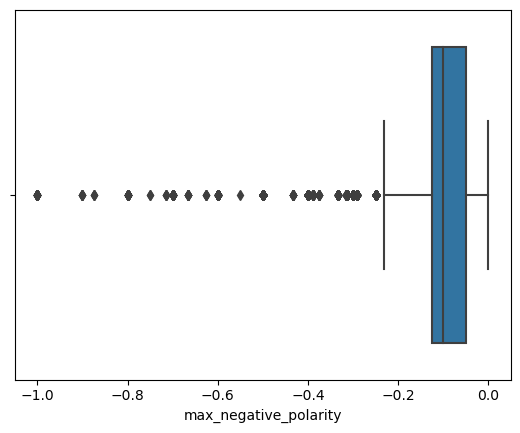

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


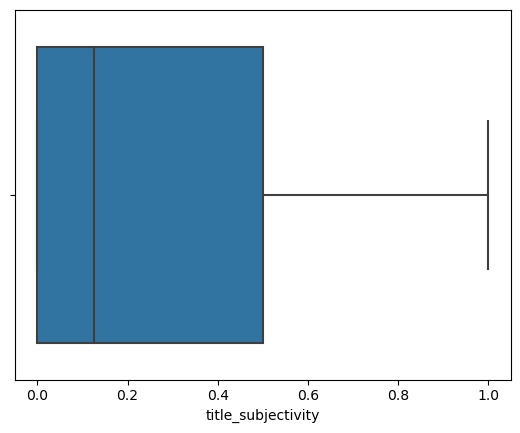

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


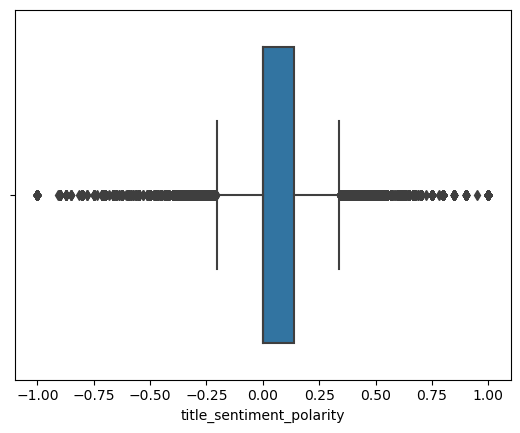

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


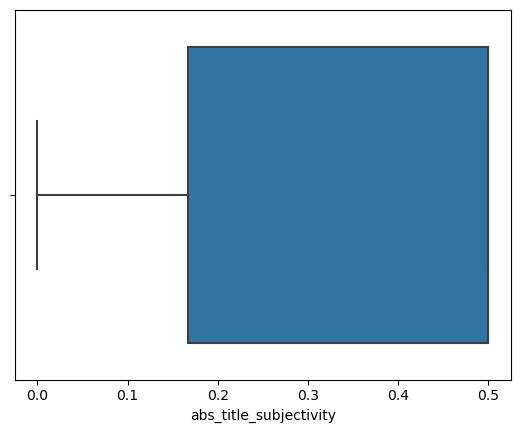

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


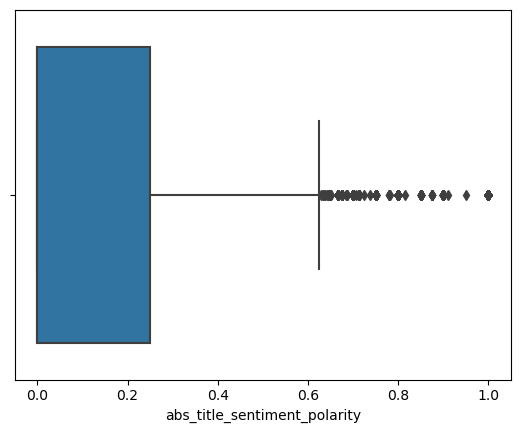

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


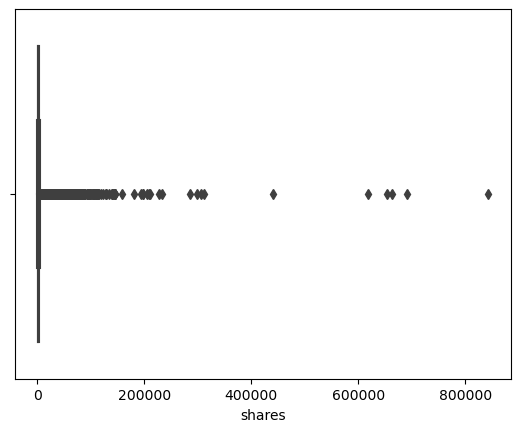

In [ ]:
num_cols = df.select_dtypes(['int64','float64']).columns
for i in range(len(num_cols)):
    sns.boxplot(df[num_cols[i]])
    plt.show()

In [ ]:
for column in num_cols:
    # First Quartile
    q1 = df[column].quantile(0.25)
    # Third Quartile
    q3 = df[column].quantile(0.75)
    # Inter Quartile Range
    IQR = q3 - q1
    # Lower Limit
    llimit = q1 - 1.5*IQR
    # Upper Limit
    ulimit = q3 + 1.5*IQR

    outliers = df[(df[column] < llimit) | (df[column] > ulimit)]
    print('Number of outliers in "' + column + '" : ' + str(len(outliers)))
    print(llimit)
    print(ulimit)
    print(IQR)

Number of outliers in "n_tokens_title" : 155
4.5
16.5
3.0
Number of outliers in "n_tokens_content" : 1875
-446.0
1434.0
470.0
Number of outliers in "n_unique_tokens" : 490
0.27688172150000007
0.8116487415
0.13369175499999997
Number of outliers in "num_hrefs" : 2636
-8.5
27.5
9.0
Number of outliers in "num_self_hrefs" : 2090
-3.5
8.5
3.0
Number of outliers in "num_imgs" : 7466
-3.5
8.5
3.0
Number of outliers in "num_videos" : 2939
-1.5
2.5
1.0
Number of outliers in "average_token_length" : 552
3.9477737417499994
5.410377035750001
0.3656508235000002
Number of outliers in "num_keywords" : 50
1.5
13.5
3.0
Number of outliers in "data_channel_is_lifestyle" : 2077
0.0
0.0
0.0
Number of outliers in "data_channel_is_entertainment" : 6856
0.0
0.0
0.0
Number of outliers in "data_channel_is_bus" : 6235
0.0
0.0
0.0
Number of outliers in "data_channel_is_socmed" : 2311
0.0
0.0
0.0
Number of outliers in "data_channel_is_tech" : 7325
0.0
0.0
0.0
Number of outliers in "data_channel_is_world" : 8168
0.0

We can remove this ouliers after applying transformation

Scaling of the dataset

In [ ]:
# First we will seperate the numerical and categorical attributes
numeric_cols=df.drop(["weekday_is_monday","weekday_is_tuesday","weekday_is_wednesday","weekday_is_thursday","weekday_is_friday","weekday_is_saturday","weekday_is_sunday","is_weekend","weekdays","data_channel","popularity","data_channel_is_lifestyle","data_channel_is_entertainment","data_channel_is_bus","data_channel_is_socmed","data_channel_is_tech","data_channel_is_world"],axis=1)

categoric_cols=df[["weekday_is_monday","weekday_is_tuesday","weekday_is_wednesday","weekday_is_thursday","weekday_is_friday","weekday_is_saturday","weekday_is_sunday","is_weekend","weekdays","data_channel","popularity","data_channel_is_lifestyle","data_channel_is_entertainment","data_channel_is_bus","data_channel_is_socmed","data_channel_is_tech","data_channel_is_world"]]


In [ ]:
# Dropping target variable from df2_num
numeric_cols = numeric_cols.drop('shares',axis=1)

In [ ]:
print(numeric_cols.columns)
numeric_cols.shape

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'kw_min_min', 'kw_max_min', 'kw_min_max', 'kw_max_max',
       'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg',
       'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03',
       'LDA_04', 'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'rate_positive_words', 'rate_negative_words', 'avg_positive_polarity',
       'min_positive_polarity', 'max_positive_polarity',
       'avg_negative_polarity', 'min_negative_polarity',
       'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity'],
      dtype='object')


(39518, 41)

In [ ]:
# Finding negative values.

negcols = numeric_cols.columns[(numeric_cols <= 0).any()]
print(negcols)

Index(['num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos', 'kw_min_min',
       'kw_max_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg',
       'kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares',
       'self_reference_max_shares', 'self_reference_avg_sharess', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity'],
      dtype='object')


We will use box-cox method of scaling because the distribution of attributes is not normal and has a lot of negative values whereas box-cox can only be applied to strictly positive data

In [ ]:
# converting negative values to positive values for applying Box-Cox method and creating new feature.
for i in negcols:
    m=numeric_cols[i].min()
    name=i +'_new'
    numeric_cols[name]=((numeric_cols[i]+1)-m)

In [ ]:
print(numeric_cols.columns)
numeric_cols.shape

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'kw_min_min', 'kw_max_min', 'kw_min_max', 'kw_max_max',
       'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg',
       'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03',
       'LDA_04', 'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'rate_positive_words', 'rate_negative_words', 'avg_positive_polarity',
       'min_positive_polarity', 'max_positive_polarity',
       'avg_negative_polarity', 'min_negative_polarity',
       'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity', 'num_hrefs_new', 'num_self_hrefs_new',
       'num_imgs_new', 'num_videos_new', 'k

(39518, 77)

In [ ]:
# Droping old negative columns

for i in negcols:
    numeric_cols.drop(i,axis=1,inplace=True)

In [ ]:
# Again Finding negative values.

negcols = numeric_cols.columns[(numeric_cols < 0).any()]
print(negcols)

Index([], dtype='object')


In [ ]:
pt = preprocessing.PowerTransformer(method='box-cox',standardize=False)
numeric_cols_add = pt.fit_transform(numeric_cols)
numeric_cols_add = (pd.DataFrame(numeric_cols_add,columns=numeric_cols.columns))

In [ ]:
#Treating outliers

for col in numeric_cols_add.columns:
    percentiles = numeric_cols_add[col].quantile([0.01,0.99]).values
    numeric_cols_add[col][numeric_cols_add[col] <= percentiles[0]] = percentiles[0]
    numeric_cols_add[col][numeric_cols_add[col] >= percentiles[1]] = percentiles[1]

In [ ]:
# Checking outliers again

num_cols = numeric_cols_add.select_dtypes(['int64','float64']).columns

for column in num_cols:
    q1 = numeric_cols_add[column].quantile(0.25)    # First Quartile
    q3 = numeric_cols_add[column].quantile(0.75)    # Third Quartile
    IQR = q3 - q1                            # Inter Quartile Range

    llimit = q1 - 1.5*IQR                       # Lower Limit
    ulimit = q3 + 1.5*IQR                        # Upper Limit

    outliers = numeric_cols_add[(numeric_cols_add[column] < llimit) | (numeric_cols_add[column] > ulimit)]
    print('Number of outliers in "' + column + '" : ' + str(len(outliers)))
    print(llimit)
    print(ulimit)
    print(IQR)

Number of outliers in "n_tokens_title" : 0
3.0351766196848686
9.255141622951946
1.5549912508167694
Number of outliers in "n_tokens_content" : 0
3.8606109358471805
7.438987854892925
0.8945942297614362
Number of outliers in "n_unique_tokens" : 521
-1.144733078746551
-0.11457995805176402
0.25753828017369673
Number of outliers in "average_token_length" : 0
0.7213219115441651
0.7805063821221365
0.014796117644492845
Number of outliers in "num_keywords" : 0
0.08898030896099218
14.927545776135672
3.7096413667936696
Number of outliers in "num_hrefs_new" : 0
0.549171638846343
3.43450060777549
0.7213322422322868
Number of outliers in "num_self_hrefs_new" : 0
-0.6296914468162643
2.8728195095119466
0.8756277390820527
Number of outliers in "num_imgs_new" : 0
-0.16197366610802344
1.8075267721179116
0.4923751095564838
Number of outliers in "num_videos_new" : 0
-0.6194220377541412
1.0323700629235686
0.41294802516942747
Number of outliers in "kw_min_min_new" : 0
-1.7368309261901067
2.8947182103168445
1.

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


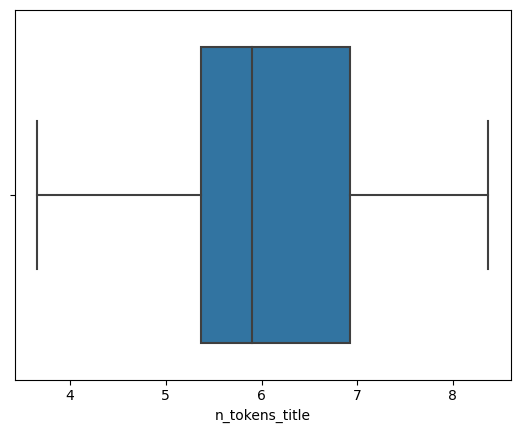

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


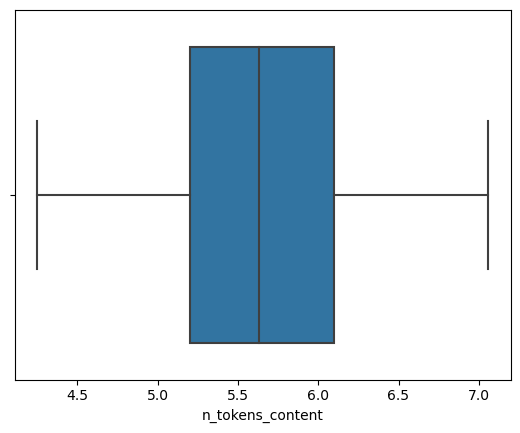

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


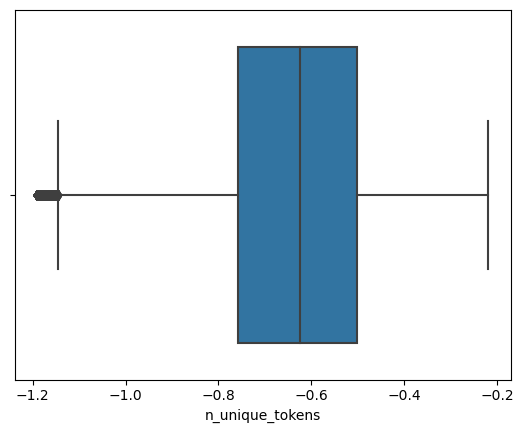

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


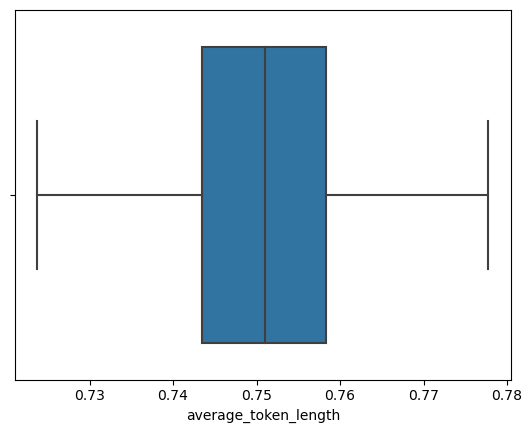

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


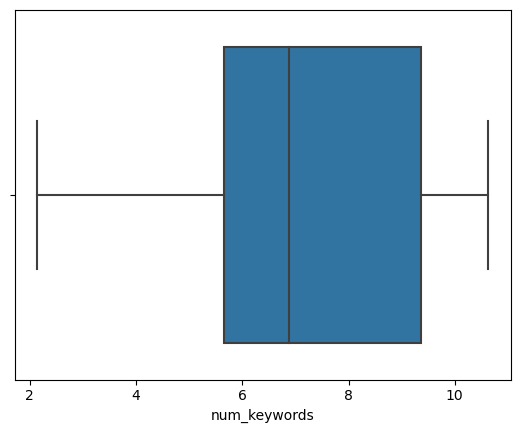

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


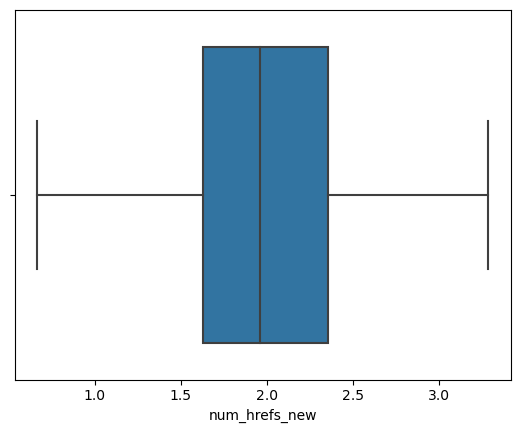

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


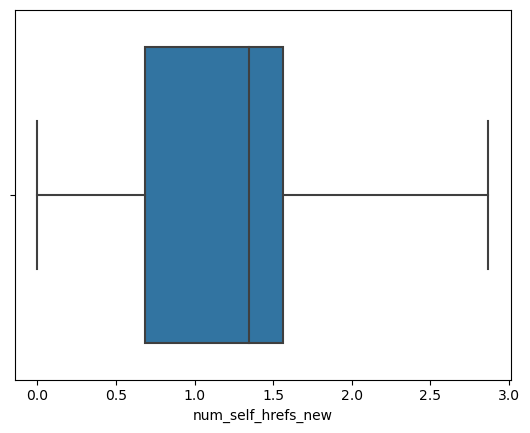

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


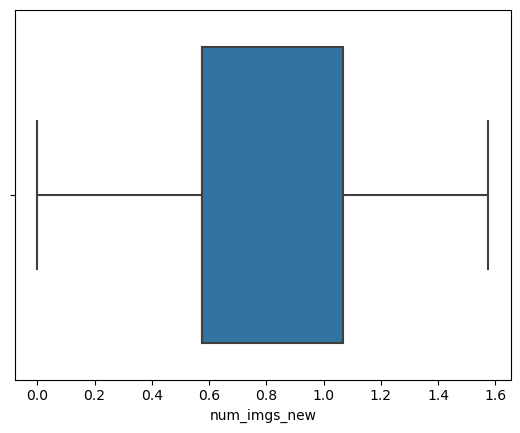

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


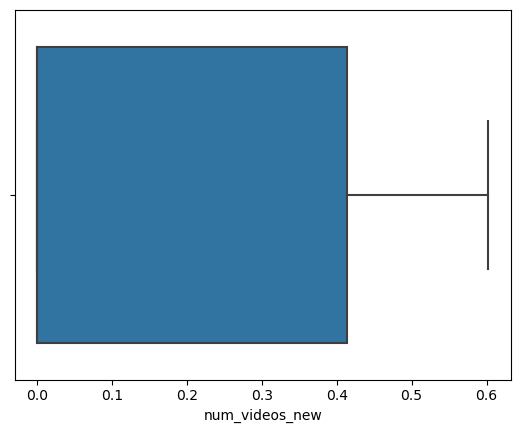

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


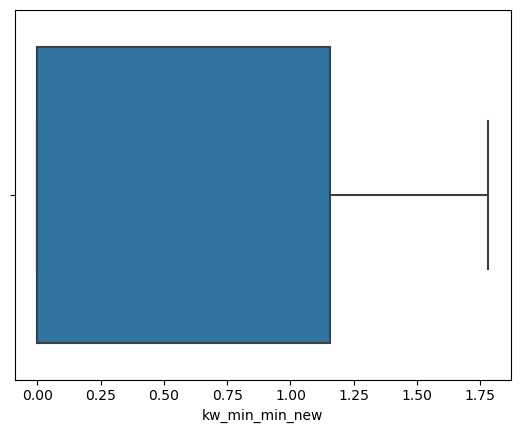

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


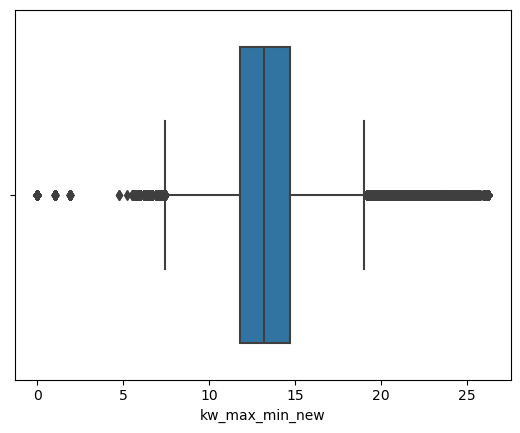

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


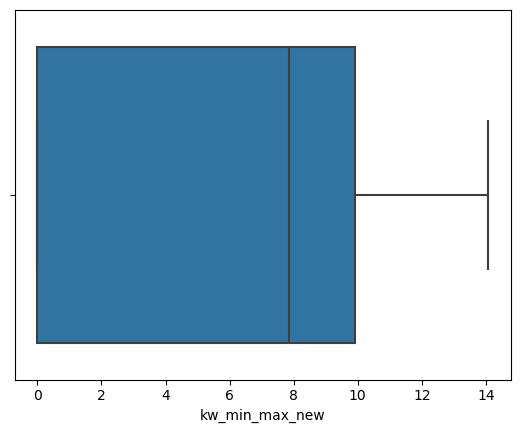

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


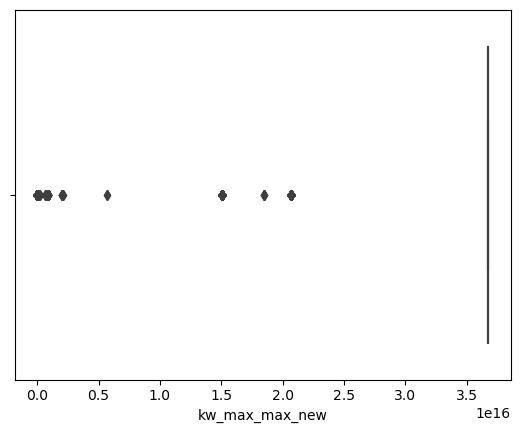

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


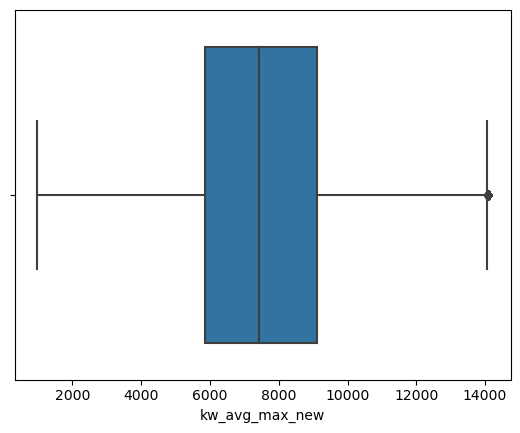

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


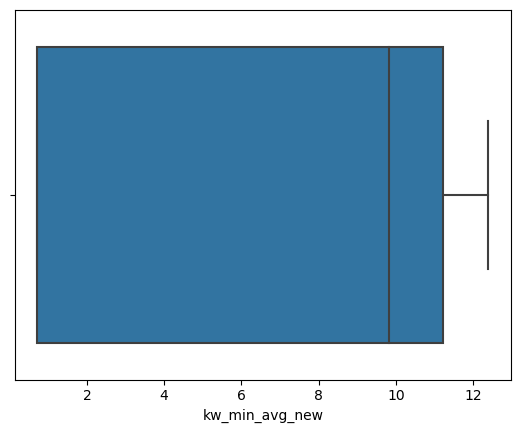

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


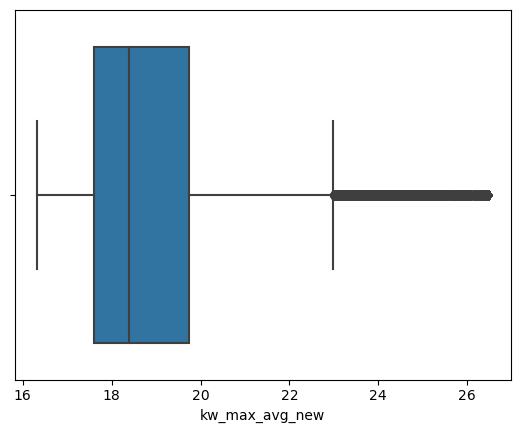

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


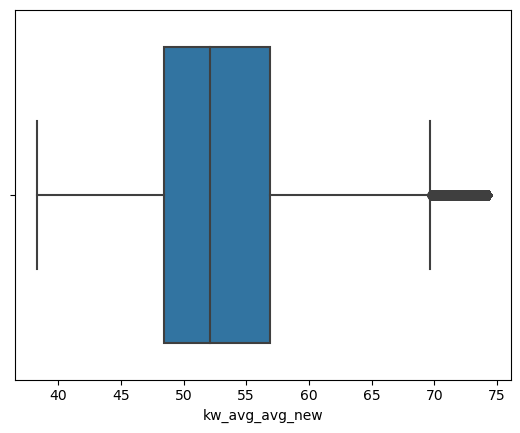

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


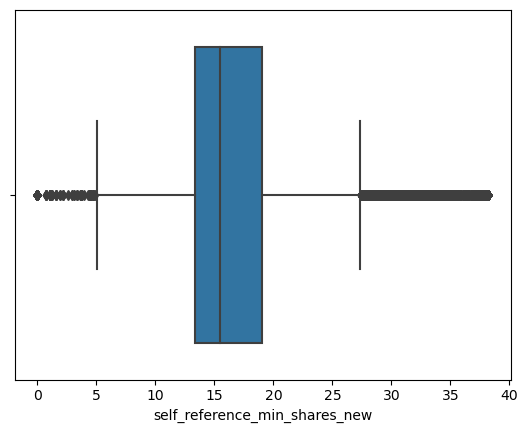

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


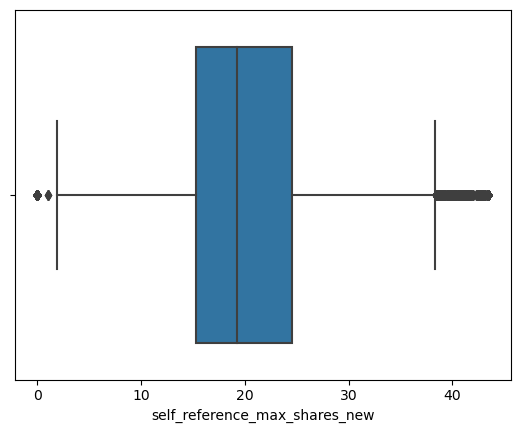

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


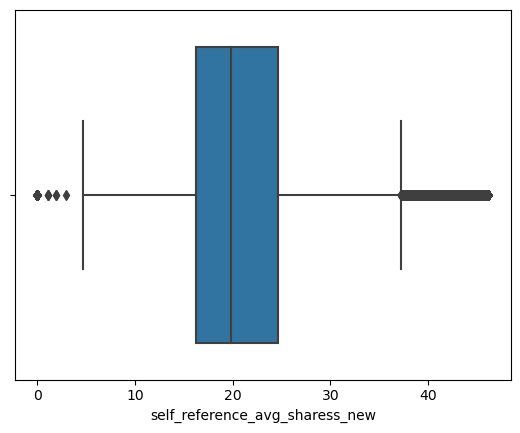

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


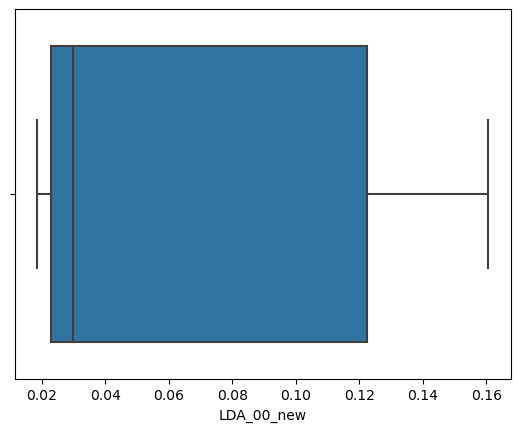

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


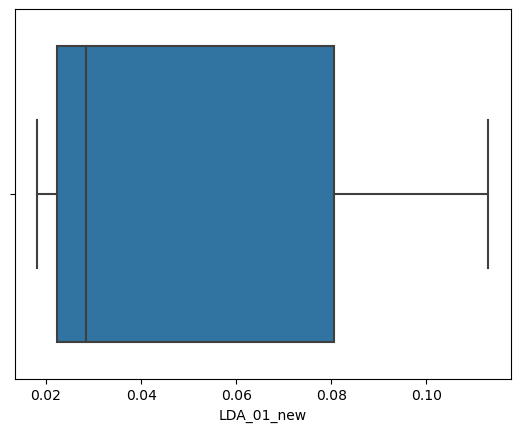

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


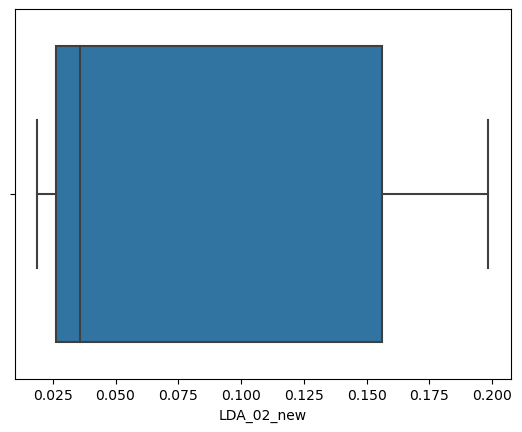

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


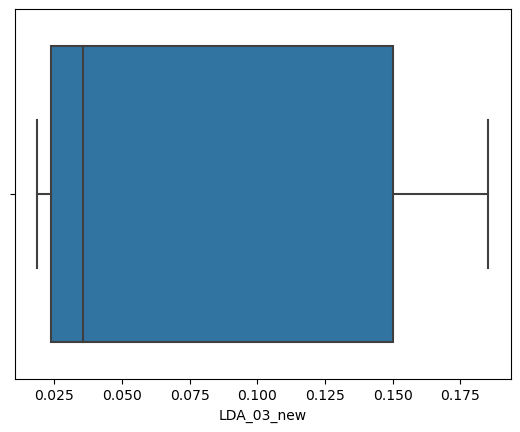

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


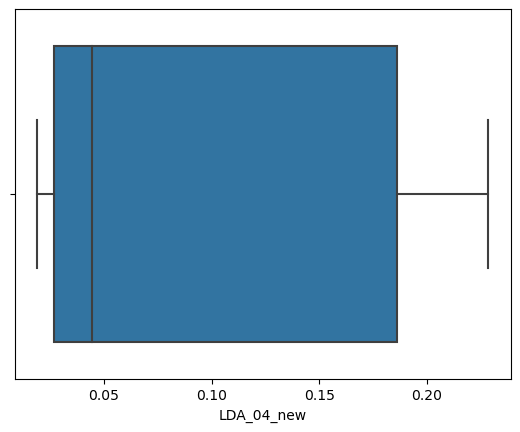

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


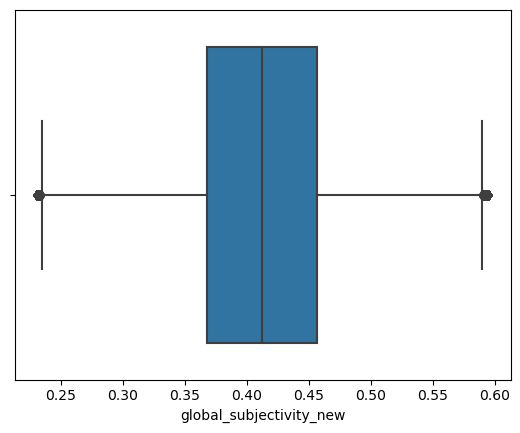

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


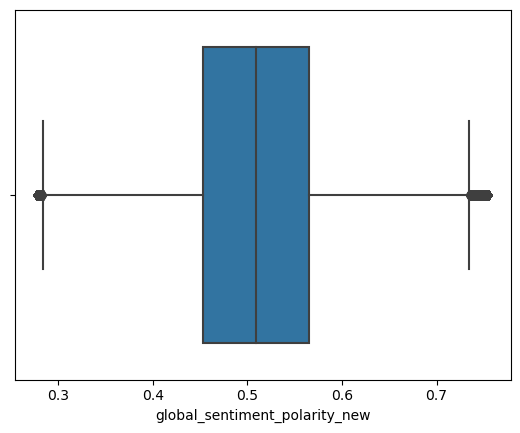

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


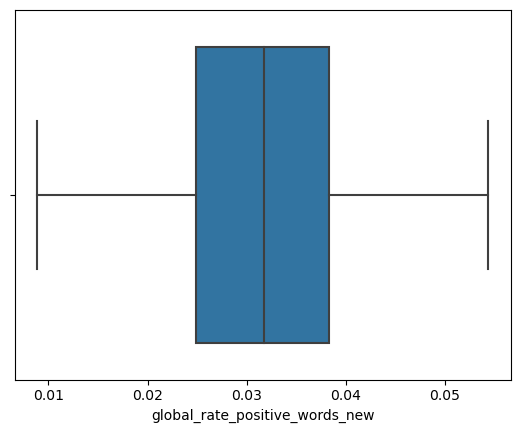

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


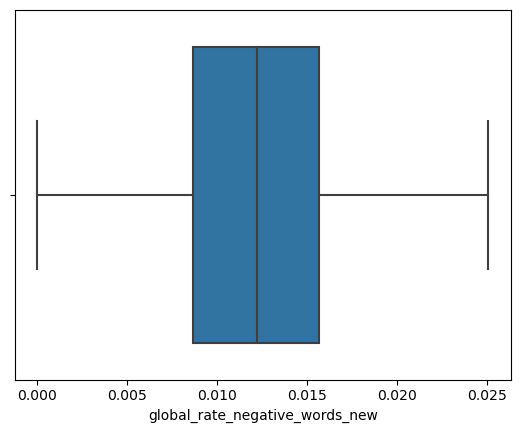

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


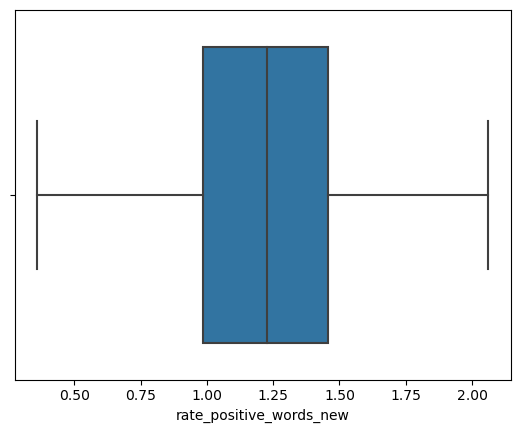

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


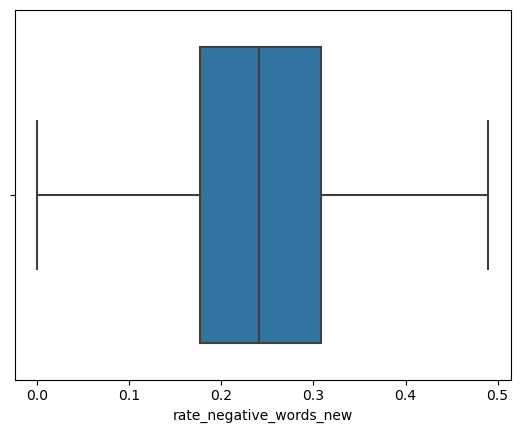

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


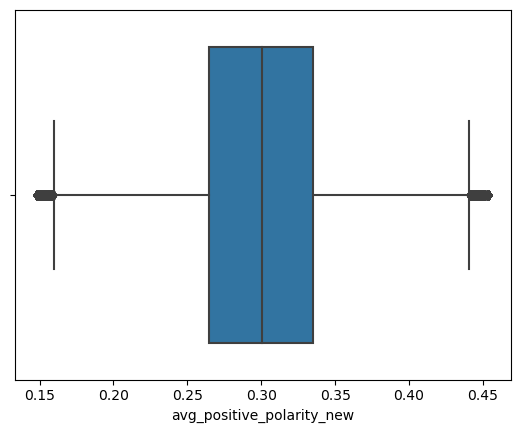

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


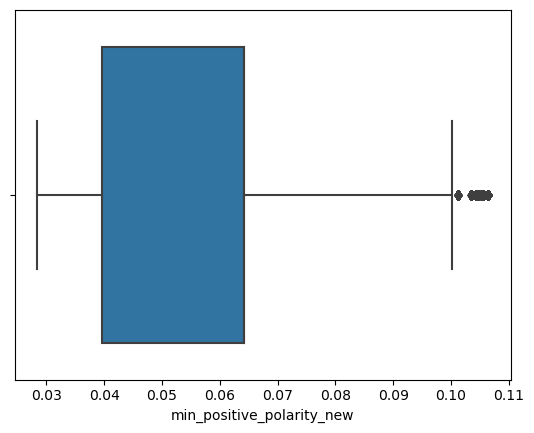

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


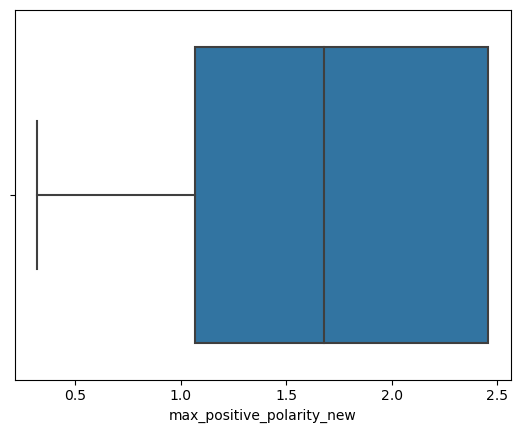

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


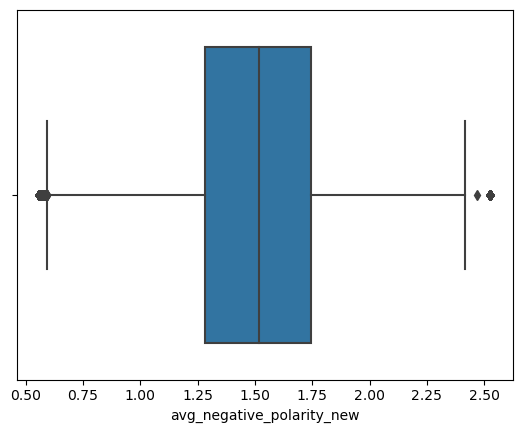

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


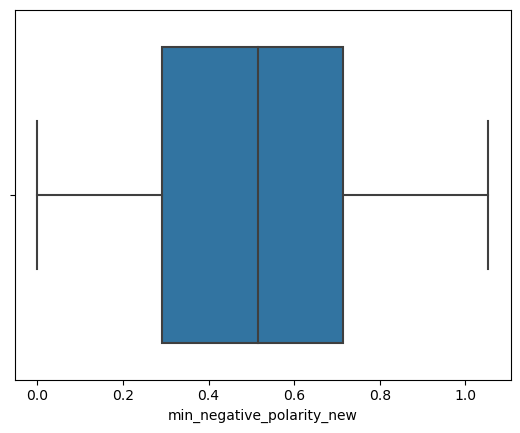

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


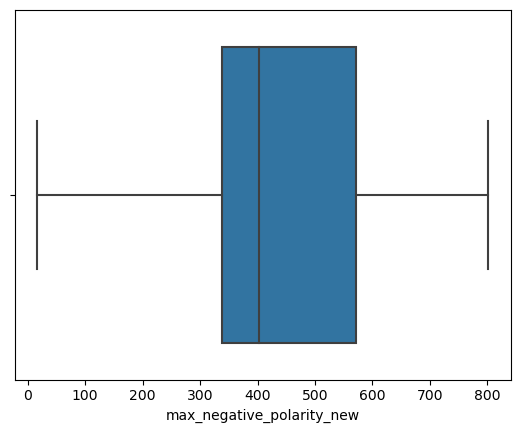

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


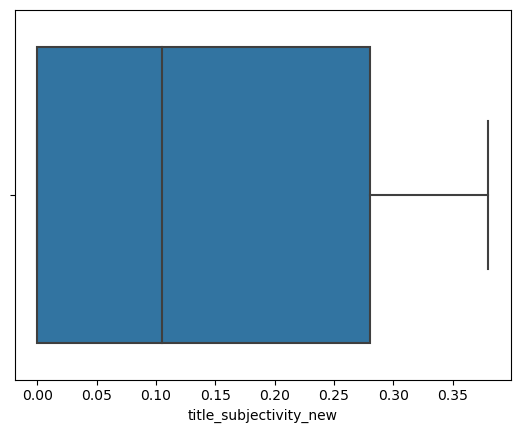

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


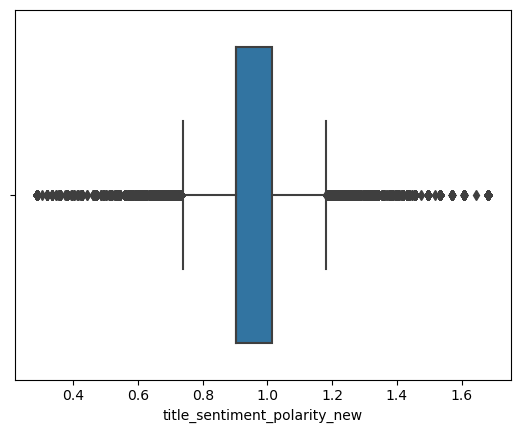

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


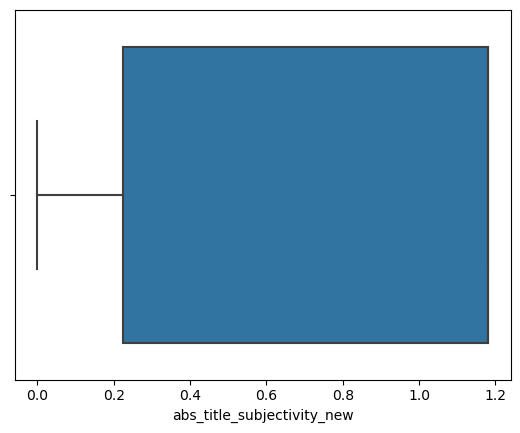

c:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


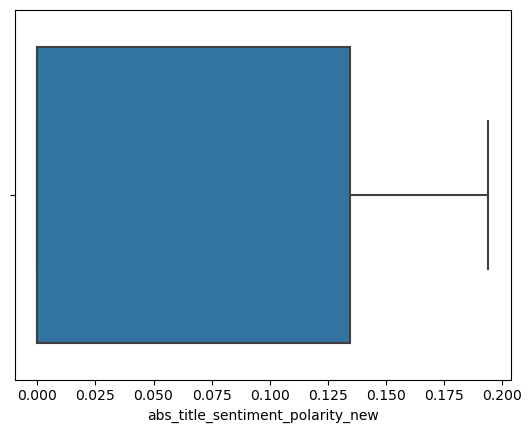

In [ ]:
num_cols = numeric_cols_add.select_dtypes(['int64','float64']).columns
for i in range(len(num_cols)):
    sns.boxplot(numeric_cols_add[num_cols[i]])
    plt.show()

In [ ]:
numeric_cols_add.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'average_token_length', 'num_keywords', 'num_hrefs_new',
       'num_self_hrefs_new', 'num_imgs_new', 'num_videos_new',
       'kw_min_min_new', 'kw_max_min_new', 'kw_min_max_new', 'kw_max_max_new',
       'kw_avg_max_new', 'kw_min_avg_new', 'kw_max_avg_new', 'kw_avg_avg_new',
       'self_reference_min_shares_new', 'self_reference_max_shares_new',
       'self_reference_avg_sharess_new', 'LDA_00_new', 'LDA_01_new',
       'LDA_02_new', 'LDA_03_new', 'LDA_04_new', 'global_subjectivity_new',
       'global_sentiment_polarity_new', 'global_rate_positive_words_new',
       'global_rate_negative_words_new', 'rate_positive_words_new',
       'rate_negative_words_new', 'avg_positive_polarity_new',
       'min_positive_polarity_new', 'max_positive_polarity_new',
       'avg_negative_polarity_new', 'min_negative_polarity_new',
       'max_negative_polarity_new', 'title_subjectivity_new',
       'title_sentiment_polarity_new

In [ ]:
categoric_cols.columns

Index(['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday',
       'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday',
       'weekday_is_sunday', 'is_weekend', 'weekdays', 'data_channel',
       'popularity', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world'],
      dtype='object')

In [ ]:
# Combining numeric features and catogorical features.

df_final=pd.concat([numeric_cols_add,categoric_cols],axis=1)

In [ ]:
df_final.shape

(39635, 58)

In [ ]:
df_final.isnull().sum()

n_tokens_title                      1172
n_tokens_content                    1172
n_unique_tokens                     1172
average_token_length                1172
num_keywords                        1172
num_hrefs_new                       1172
num_self_hrefs_new                  1172
num_imgs_new                        1172
num_videos_new                      1172
kw_min_min_new                      1172
kw_max_min_new                      1172
kw_min_max_new                      1172
kw_max_max_new                      1172
kw_avg_max_new                      1172
kw_min_avg_new                      1172
kw_max_avg_new                      1172
kw_avg_avg_new                      1172
self_reference_min_shares_new       1172
self_reference_max_shares_new       1172
self_reference_avg_sharess_new      1172
LDA_00_new                          1172
LDA_01_new                          1172
LDA_02_new                          1172
LDA_03_new                          1172
LDA_04_new      

In [ ]:
df_final=df_final.dropna()

In [ ]:
df_final.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'average_token_length', 'num_keywords', 'num_hrefs_new',
       'num_self_hrefs_new', 'num_imgs_new', 'num_videos_new',
       'kw_min_min_new', 'kw_max_min_new', 'kw_min_max_new', 'kw_max_max_new',
       'kw_avg_max_new', 'kw_min_avg_new', 'kw_max_avg_new', 'kw_avg_avg_new',
       'self_reference_min_shares_new', 'self_reference_max_shares_new',
       'self_reference_avg_sharess_new', 'LDA_00_new', 'LDA_01_new',
       'LDA_02_new', 'LDA_03_new', 'LDA_04_new', 'global_subjectivity_new',
       'global_sentiment_polarity_new', 'global_rate_positive_words_new',
       'global_rate_negative_words_new', 'rate_positive_words_new',
       'rate_negative_words_new', 'avg_positive_polarity_new',
       'min_positive_polarity_new', 'max_positive_polarity_new',
       'avg_negative_polarity_new', 'min_negative_polarity_new',
       'max_negative_polarity_new', 'title_subjectivity_new',
       'title_sentiment_polarity_new

In [ ]:
shares = df['shares']

In [ ]:
df_final=pd.concat([df_final,shares],axis=1)

In [ ]:
print(df_final.columns)
df_final.shape

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'average_token_length', 'num_keywords', 'num_hrefs_new',
       'num_self_hrefs_new', 'num_imgs_new', 'num_videos_new',
       'kw_min_min_new', 'kw_max_min_new', 'kw_min_max_new', 'kw_max_max_new',
       'kw_avg_max_new', 'kw_min_avg_new', 'kw_max_avg_new', 'kw_avg_avg_new',
       'self_reference_min_shares_new', 'self_reference_max_shares_new',
       'self_reference_avg_sharess_new', 'LDA_00_new', 'LDA_01_new',
       'LDA_02_new', 'LDA_03_new', 'LDA_04_new', 'global_subjectivity_new',
       'global_sentiment_polarity_new', 'global_rate_positive_words_new',
       'global_rate_negative_words_new', 'rate_positive_words_new',
       'rate_negative_words_new', 'avg_positive_polarity_new',
       'min_positive_polarity_new', 'max_positive_polarity_new',
       'avg_negative_polarity_new', 'min_negative_polarity_new',
       'max_negative_polarity_new', 'title_subjectivity_new',
       'title_sentiment_polarity_new

(39518, 59)

# Data Visualization

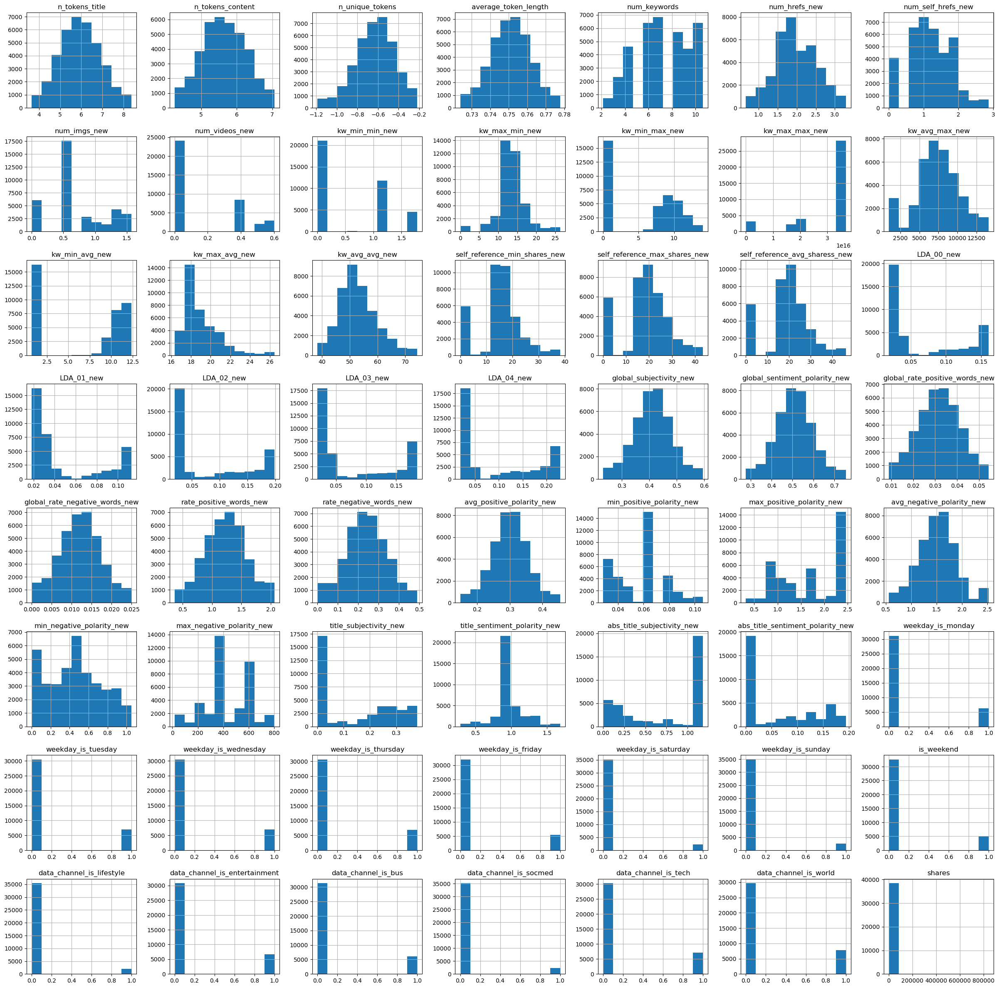

In [ ]:
df_final.hist(figsize=(30,30))
plt.show()

By using Count pot below we check for the balance of classes in popularity attribute

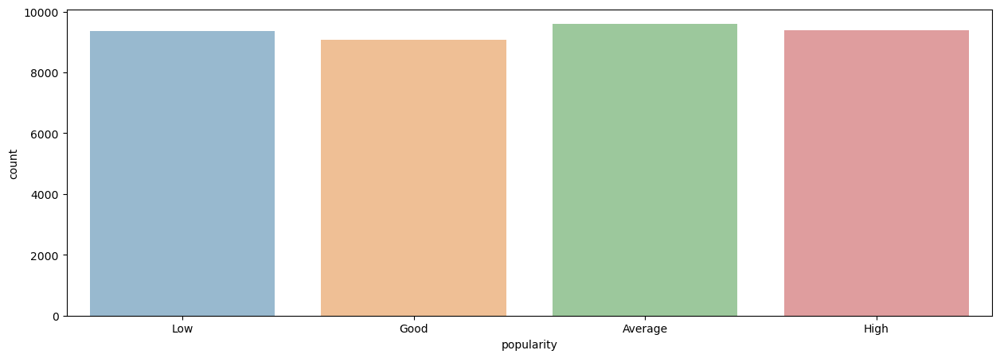

In [ ]:
fig = plt.figure(figsize=(15,5))
ax = sns.countplot(x='popularity',data=df_final,alpha=0.5)

In [ ]:
# Fetch the counts for each class
counts = df_final.groupby('popularity').size().reset_index()
counts.columns = ['Popularity','No of articles']
counts

,Popularity,No of articles
0,Average,9597
1,Good,9064
2,High,9393
3,Low,9354


In [ ]:
df_final = df_final.dropna()

<h3>To find relationship between variables we use pairplot

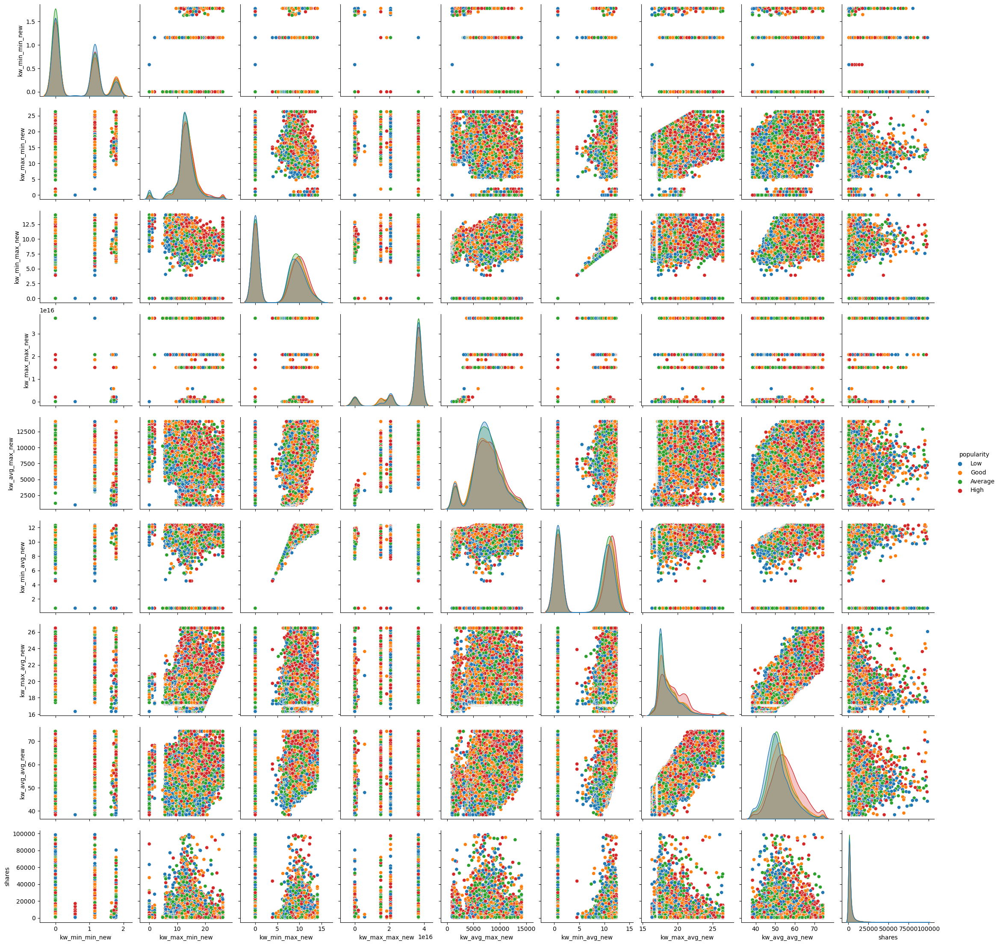

In [ ]:
temp_data = df_final[df_final['shares'] <= 100000]

kw_cols = ['kw_min_min_new', 'kw_max_min_new', 'kw_min_max_new', 'kw_max_max_new', 'kw_avg_max_new', 'kw_min_avg_new', 'kw_max_avg_new', 'kw_avg_avg_new', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

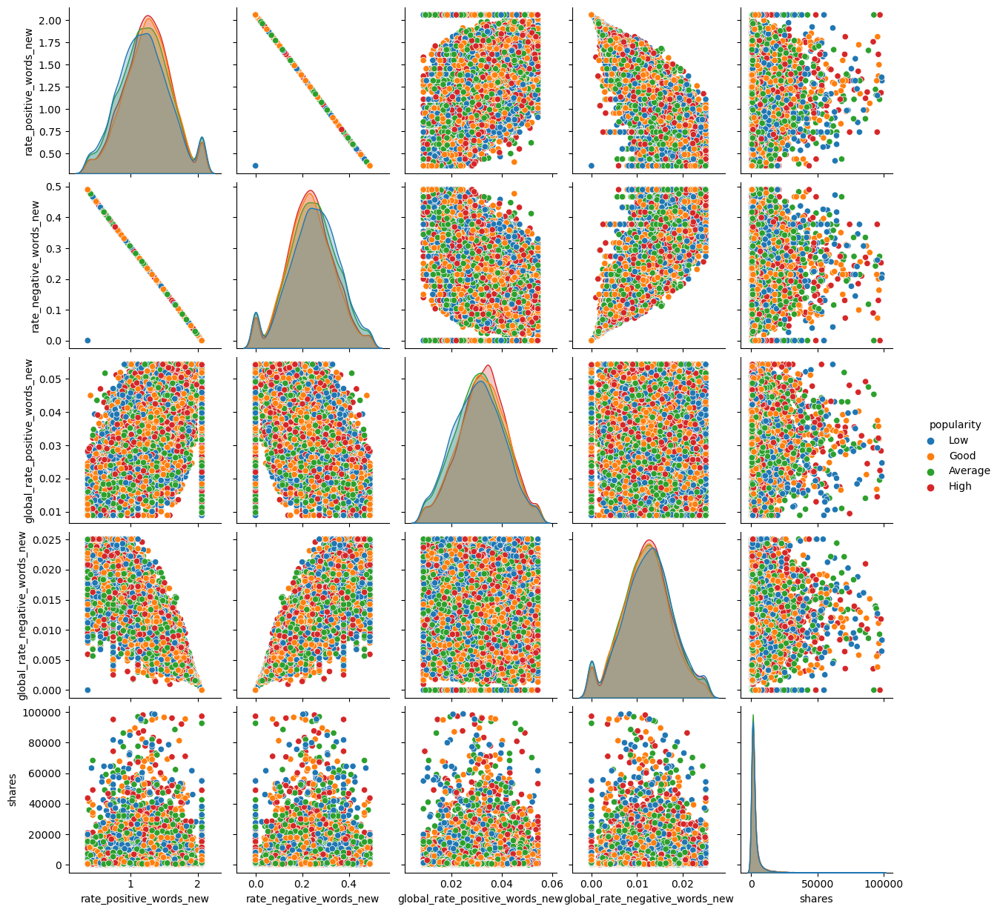

In [ ]:
temp_data = df_final[df_final['shares'] <= 100000]

kw_cols = ['rate_positive_words_new', 'rate_negative_words_new', 'global_rate_positive_words_new', 'global_rate_negative_words_new', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

Some of the inferences from above are:-
<li>There is a linear relationship between rate_positive_words and rate_negative_words
<li>rate_positive_words = No special relationship or observable trait was observed for this variable. Although most of articles tends to be on falls towards the 0.3 - 1
<li>rate_negative_words = No special relationship or observable trait was observed for this variable. Although most of articles tends to be on falls towards the 0.8 - 0 = Note the articles with popularity less than "average" have the lowest negative score rate.
<li>global_rate_positive_words - There is a slight relationship with shares. - Medium
<li>global_rate_negative_words - There is a slight relationship with shares. - Medium

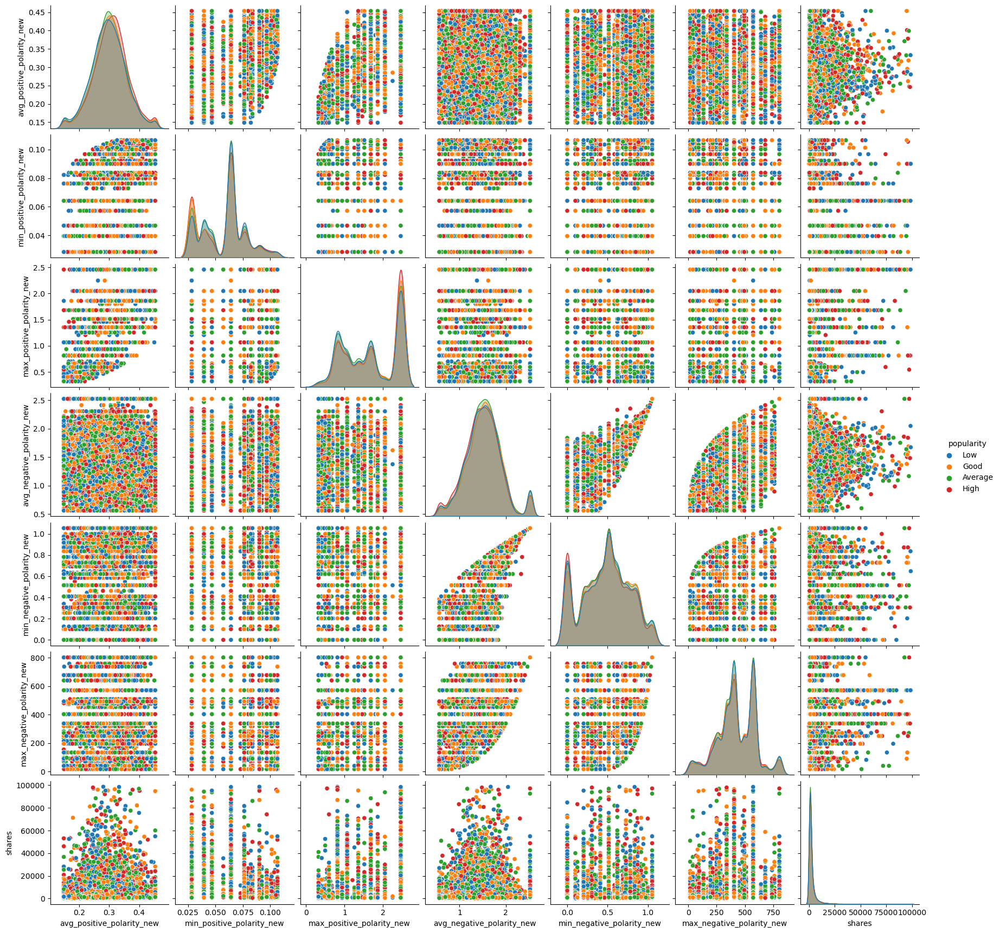

In [ ]:
temp_data = df_final[df_final['shares'] <= 100000]

kw_cols = ['avg_positive_polarity_new', 'min_positive_polarity_new', 'max_positive_polarity_new', 'avg_negative_polarity_new', 'min_negative_polarity_new', 'max_negative_polarity_new', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

avg_positive_polarity and avg_negative_polarity are good features as seen in above plots

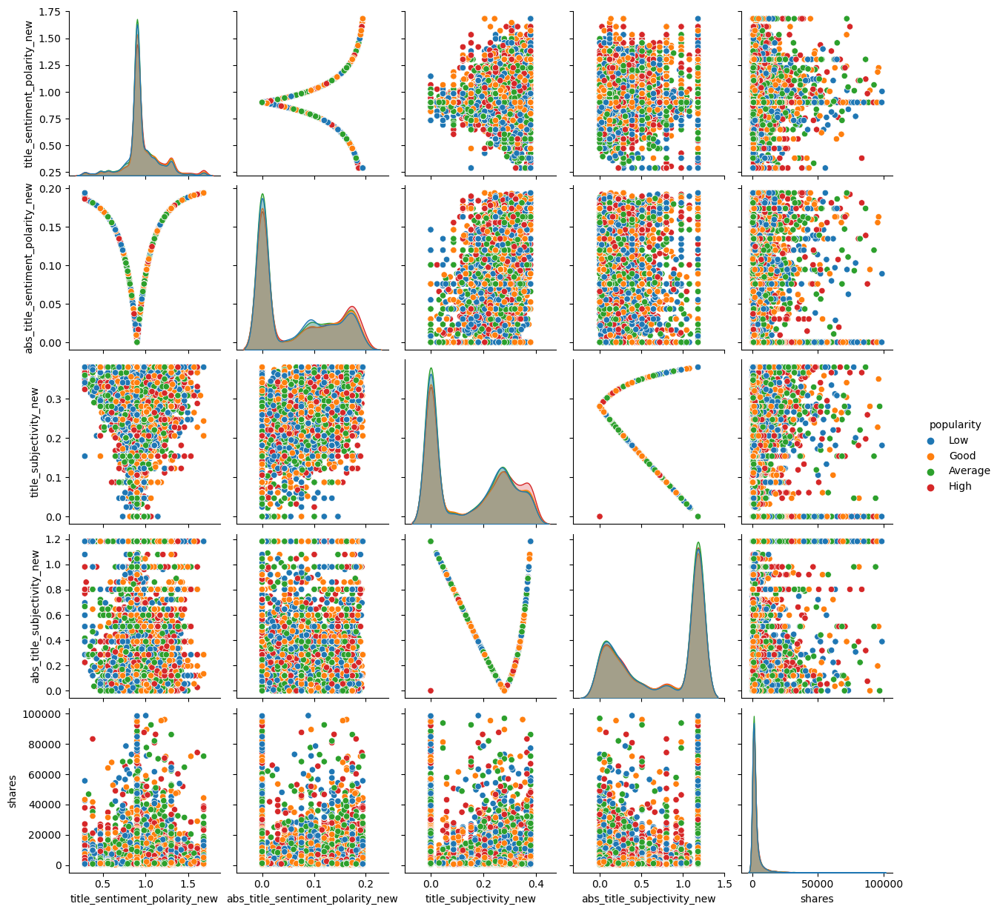

In [ ]:
temp_data = df_final[df_final['shares'] <= 100000]

kw_cols = ['title_sentiment_polarity_new', 'abs_title_sentiment_polarity_new', 'title_subjectivity_new', 'abs_title_subjectivity_new', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

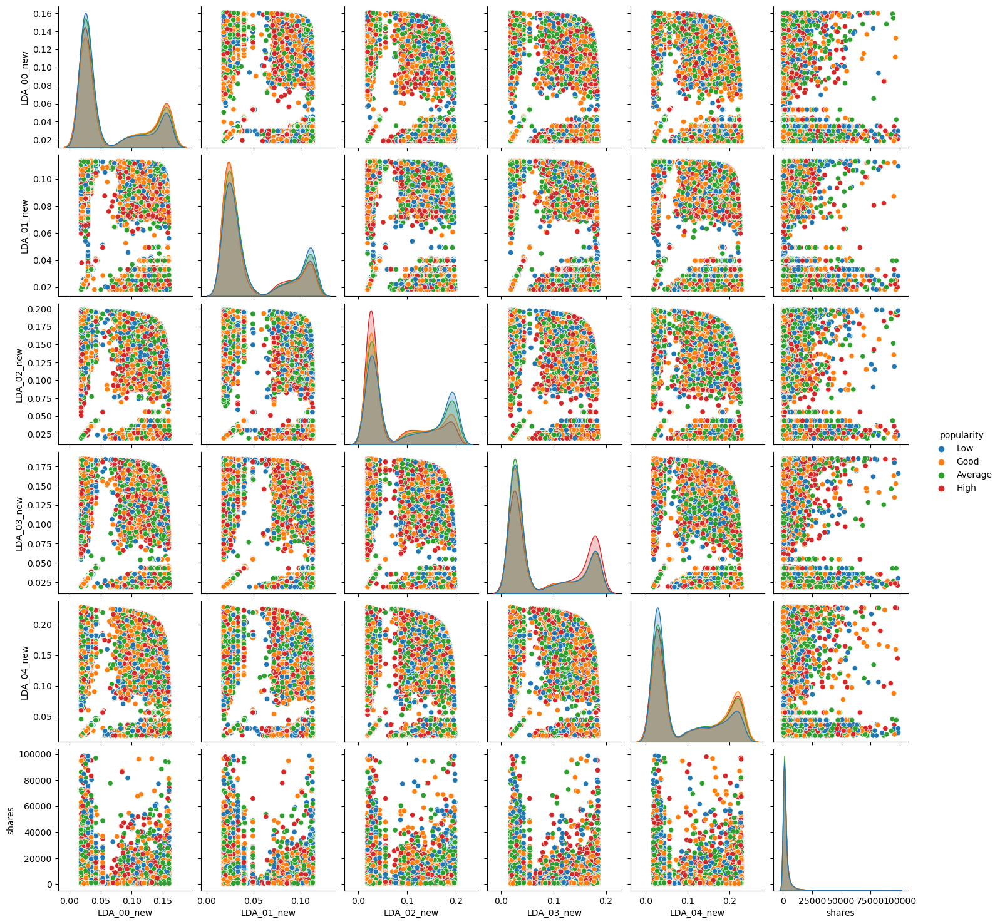

In [ ]:
temp_data = df_final[df_final['shares'] <= 100000]

kw_cols = ['LDA_00_new', 'LDA_01_new', 'LDA_02_new', 'LDA_03_new', 'LDA_04_new', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

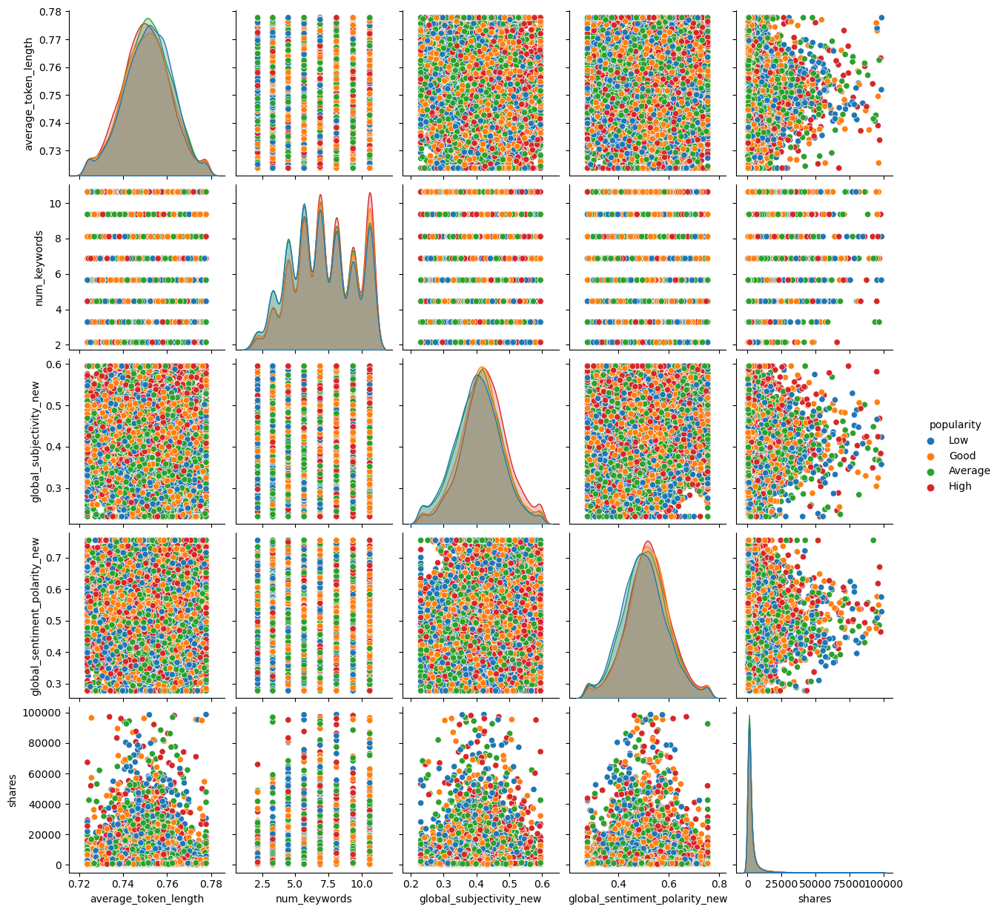

In [ ]:
temp_data = df_final[df_final['shares'] <= 100000]

kw_cols = ['average_token_length', 'num_keywords', 'global_subjectivity_new', 'global_sentiment_polarity_new', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

<h3>Impact of Weekdays

In [ ]:
weekdays_data = df_final.groupby('weekdays').size().reset_index()
weekdays_data.columns = ['weekdays','count']
weekdays_data

,weekdays,count
0,Friday,5381
1,Monday,6291
2,Saturday,2302
3,Sunday,2589
4,Thursday,6871
5,Tueday,6983
6,Wednesday,6991


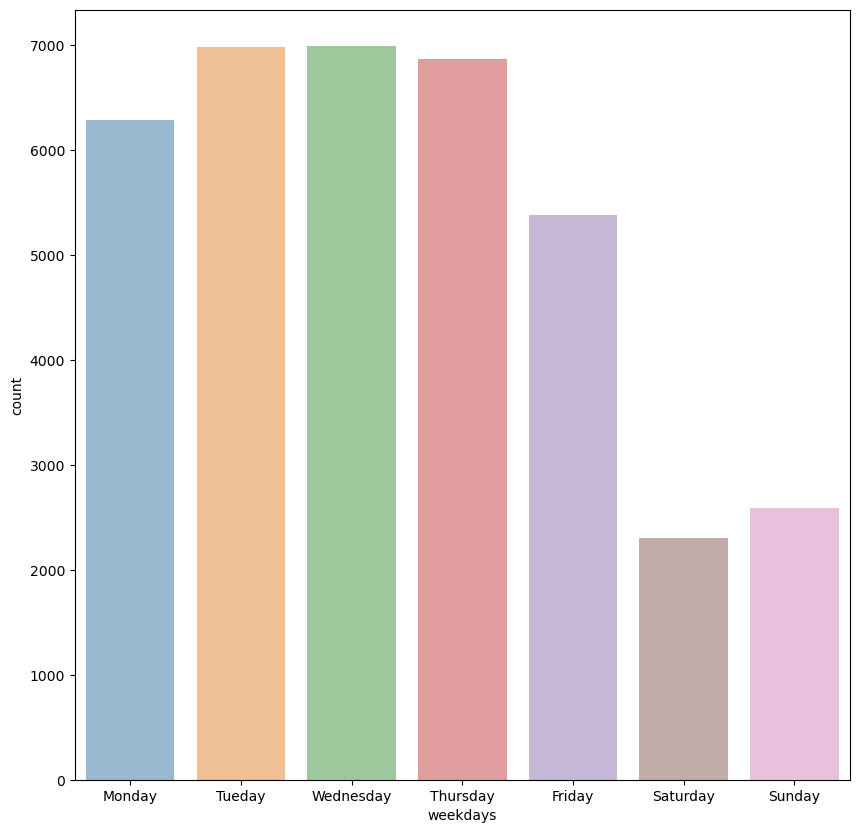

In [ ]:
fig, axes = plt.subplots(figsize=(10,10))
ax = sns.countplot(x='weekdays',data=df_final,alpha=0.5, ax=axes)

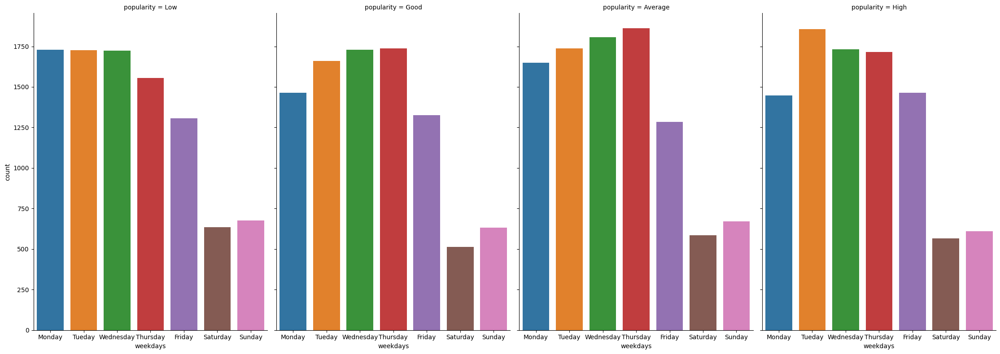

In [ ]:
conditions = ['Low', 'Average', 'Good', 'High']

temp_data = df_final[df_final['popularity'].isin(conditions)]

ax = sns.catplot(x='weekdays', col="popularity", data=temp_data, kind="count", height=8, aspect=.7, col_wrap=4)


From above plots we can see Tuesday, Wednesday and Thursday are the days when popular articles are published. Whereas, the Weekends are worst time to publish an article.

<h3>Impact of Data Channel

In [ ]:
data_channel_data = df_final.groupby('data_channel').size().reset_index()
data_channel_data.columns = ['Data Channels','No of articles']
data_channel_data

,Data Channels,No of articles
0,Business,6115
1,Entertainment,6678
2,Lifestyle,2016
3,Others,5371
4,Social Media,2275
5,Tech,7181
6,World,7772


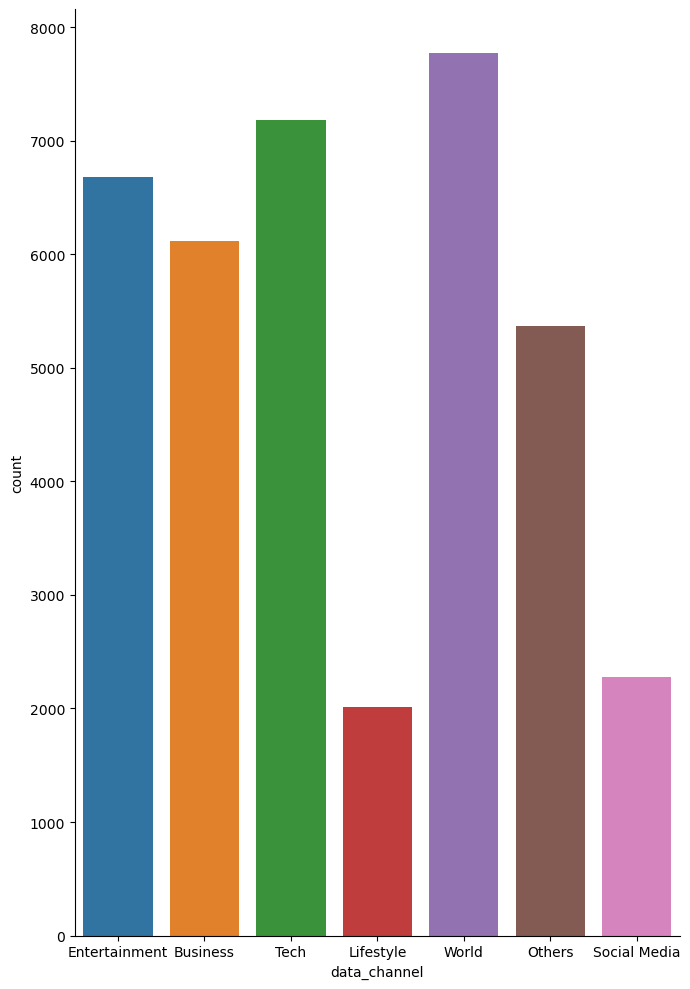

In [ ]:
sns.catplot(x='data_channel', data=df_final, kind="count", height=10, aspect=.7)

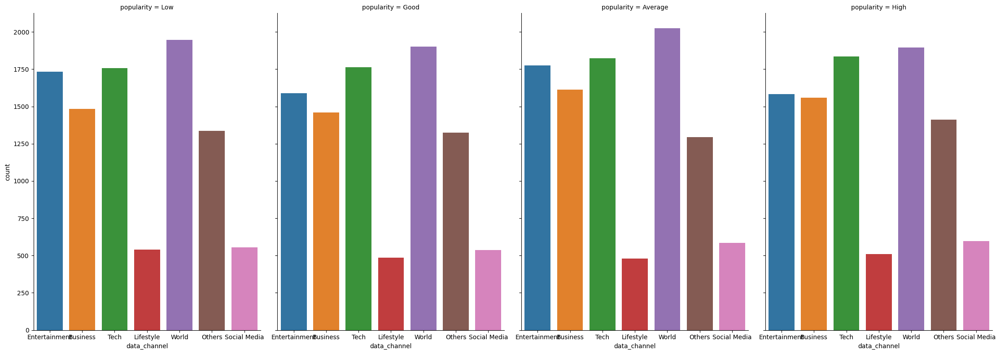

In [ ]:
conditions = ['Low', 'Average', 'Good', 'High']

temp_data = df_final[df_final['popularity'].isin(conditions)]

ax = sns.catplot(x='data_channel', col="popularity", data=temp_data, kind="count", height=8, aspect=.7, col_wrap=4)


Here, "Tech" and "World" data channel tend to produce best articles followed by "Entertainment" and "Business". "Others", "Lifestyle" and "Social Media" produce articles that are not very popular.

<h3>Relationship of Data Channel, Number of Images and Popularity

We keep a threshold of 15 as 75% of the data lies there for num_hrefs

In [ ]:
df_final['num_hrefs_new'].describe()

count    37408.000000
mean         1.957621
std          0.559768
min          0.668180
25%          1.631170
50%          1.959062
75%          2.352502
max          3.285133
Name: num_hrefs_new, dtype: float64

<AxesSubplot:xlabel='popularity', ylabel='num_imgs_new'>

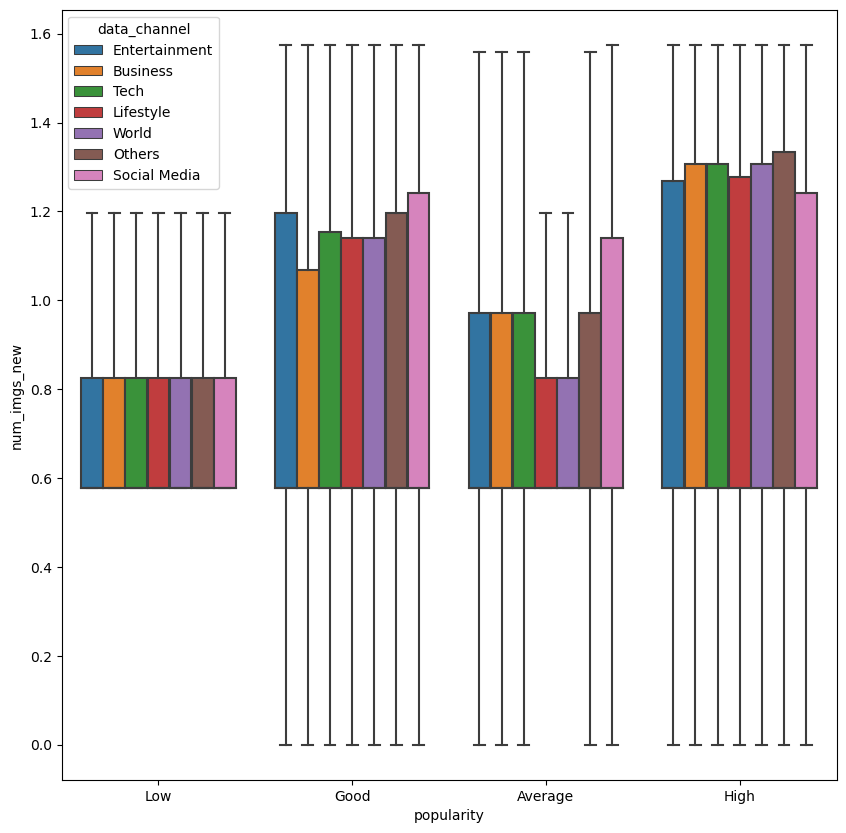

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
temp_data = df_final[df_final['num_imgs_new'] <= 25]
sns.boxplot(x='popularity',y='num_imgs_new', hue='data_channel', data=temp_data, showfliers=False)

From above boxplot we can infer that good articles tend to have high visuals (num_images) in them but it is not always the case everytime. Those rare cases where the high visuals or low visuals doesn't change anything is in the Business channel. From the plot below, we can see that Business channels generally don't get influnece by the num_images in them. They are generally low inrespective of the popularity. This is peculiar pattern. Lifestyle channels generally tend to have high visuals as their popularity increases, with the only exception in 'Average' popularity.

<AxesSubplot:xlabel='n_tokens_content', ylabel='popularity'>

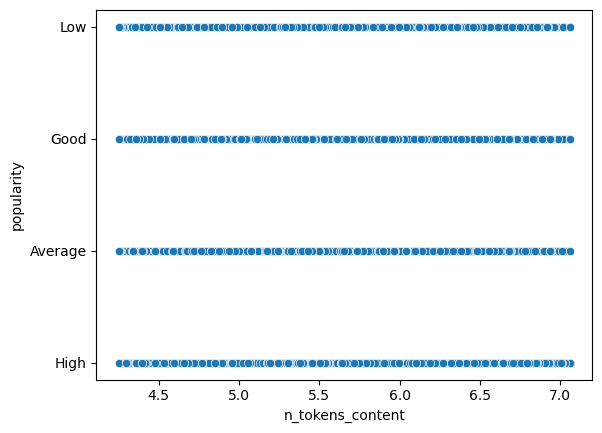

In [ ]:
#n_tokens_content
sns.scatterplot(x='n_tokens_content',y='popularity', data=df_final)

<AxesSubplot:xlabel='n_tokens_title', ylabel='shares'>

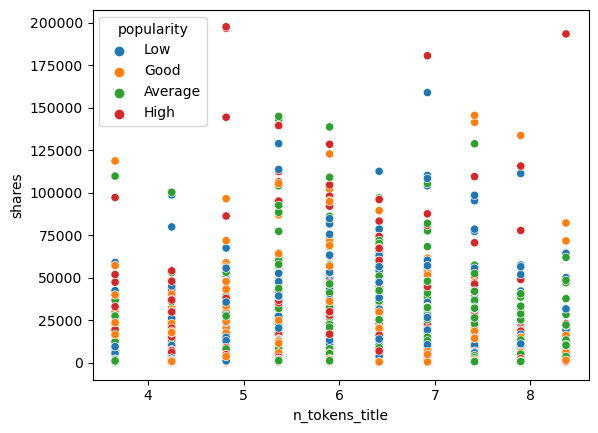

In [ ]:
#n_tokens_title
temp_data = df_final[df_final['shares'] <= 200000]
sns.scatterplot(x='n_tokens_title',y='shares', hue='popularity', data=temp_data)

<AxesSubplot:xlabel='n_unique_tokens', ylabel='shares'>

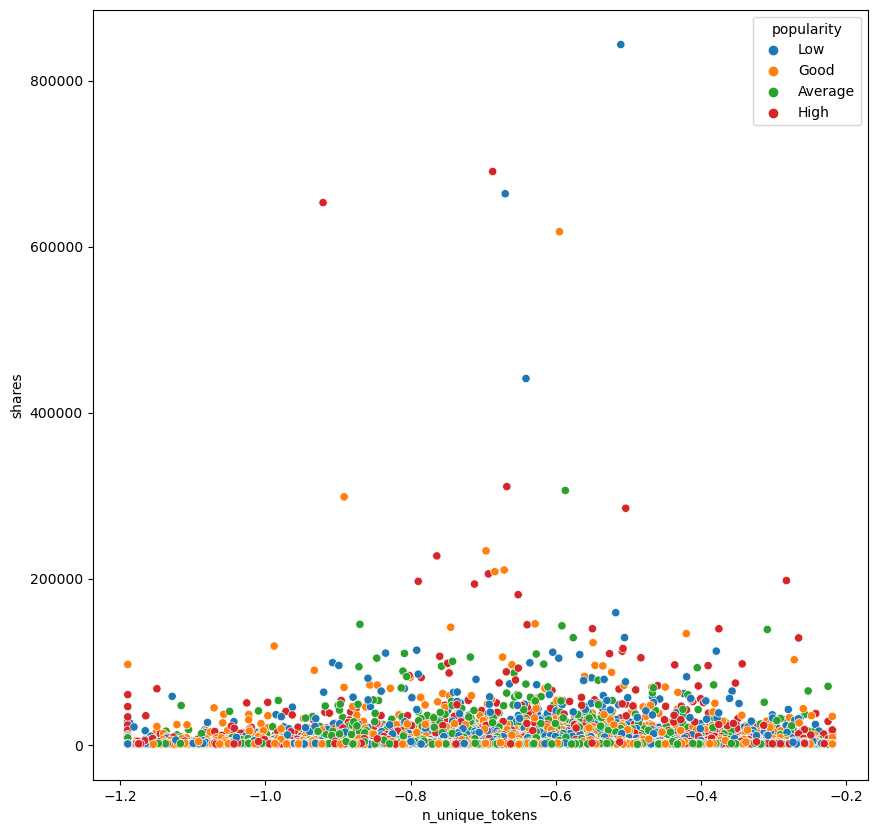

In [ ]:
#n_tokens_title
temp_data = df_final[df_final['shares'] <= 200000]
plt.figure(figsize=(10,10))
sns.scatterplot(x='n_unique_tokens',y='shares', hue='popularity', data=df_final)

<AxesSubplot:xlabel='num_hrefs_new', ylabel='shares'>

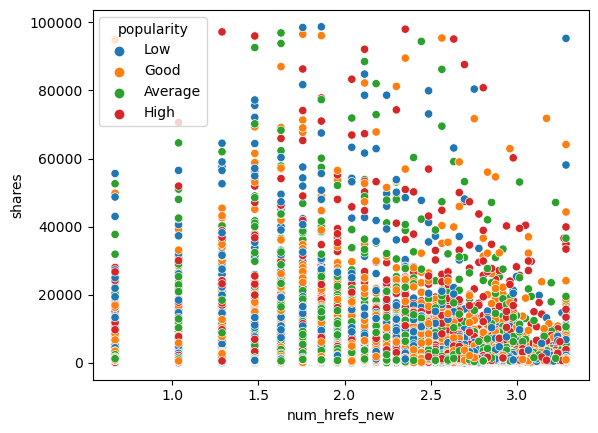

In [ ]:
#num_hrefs
temp_data = df_final[df_final['shares'] <= 100000]
sns.scatterplot(x='num_hrefs_new',y='shares', hue='popularity', data=temp_data)

(0, 59)


<AxesSubplot:xlabel='average_token_length', ylabel='shares'>

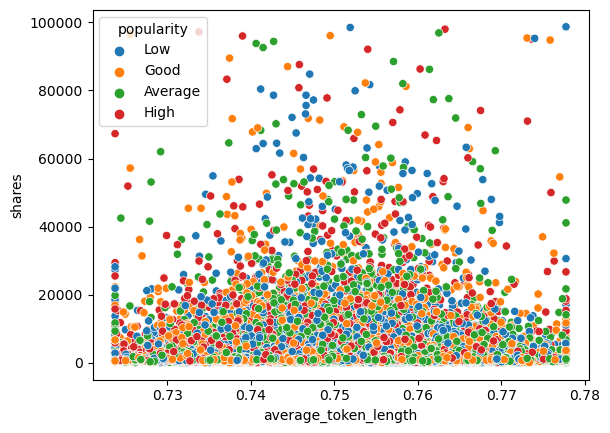

In [ ]:
#average_token_length
temp_data = df_final[df_final['shares'] <= 100000]
noise_data  = df_final[df_final['average_token_length'] == 0]
print (noise_data.shape)
sns.scatterplot(x='average_token_length',y='shares', hue='popularity', data=temp_data)

(0, 59)


<AxesSubplot:xlabel='num_keywords', ylabel='shares'>

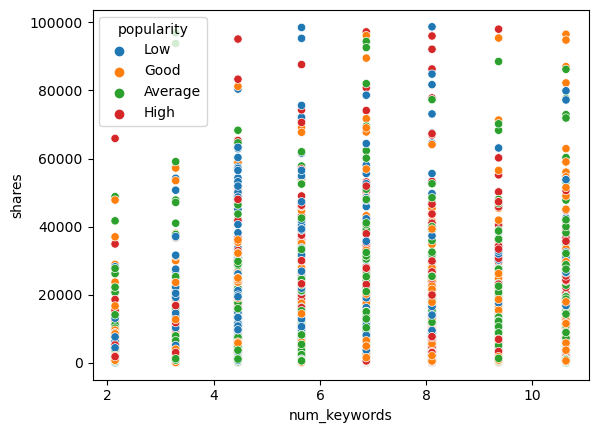

In [ ]:
#num_keywords
temp_data = df_final[df_final['shares'] <= 100000]
noise_data  = df_final[df_final['num_keywords'] == 0]
print (noise_data.shape)
#plt.figure(figsize=(30,10))
sns.scatterplot(x='num_keywords',y='shares', hue='popularity', data=temp_data)

# Final Analysis
 - n_tokens_content should be less than 2000 words. The lesser the better.
 - n_tokens_title should be between 6 - 17 words.
 - n_unique_tokens should be between 0.4 - 0.8
 - num_hrefs is between 1 and 50 referrence links
 - average_token_length should be between 4 - 6
 - The number of keywords in the metedata really influences the shares to a margin. The higher the value the better the shares chances. A value upward of 5 is recommended.
 - Here, it can be seen that the best articles with highest share popularity belongs to the "World" and "Tech" channel. For a more concrete channel, The "Business" and "Entertaiment" channel are great for the best popularity. Followed by "Others".
 - Best popular articles are usually posted on Tuesday, Wednesday and Thursday. Sundays and Saturdays (Weekends generally) are the worsts days to publish an articles.

# Normal Distribution of Shares

In [ ]:
print("Skewness: %f" % df_final['shares'].skew())
print("Kurtosis: %f" % df_final['shares'].kurt())

Skewness: 34.744634
Kurtosis: 1878.607032


c:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


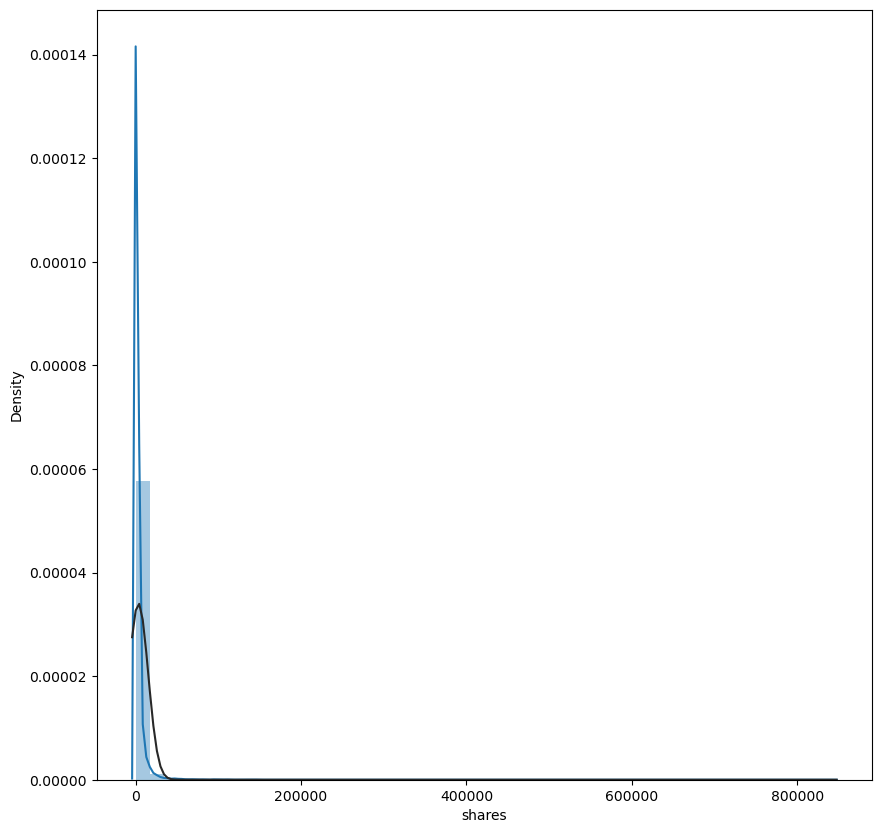

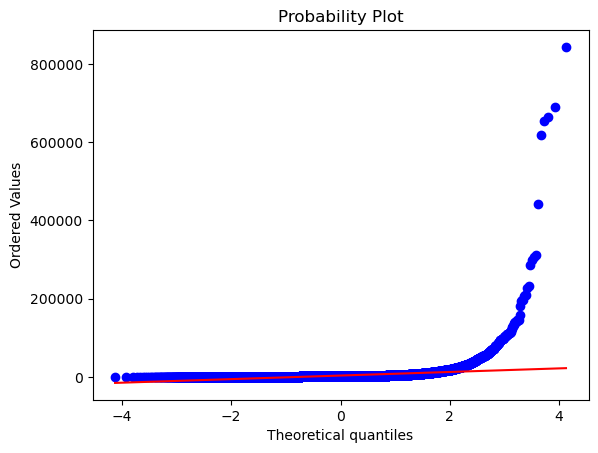

In [ ]:
temp_data = df_final[df_final['shares'] <= 100000]
fig,ax = plt.subplots(figsize=(10,10))
sns.distplot(df_final['shares'], fit=norm);
fig = plt.figure()
res = probplot(df_final['shares'], plot=plt)

'Shares' doesn't have a normal distribution. It shows 'peakedness', positive skewness and does not follow the diagonal line. Thus some statistic analysis might not be suitable for it.
<br>Thus we apply the Log Transformation to it.

c:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


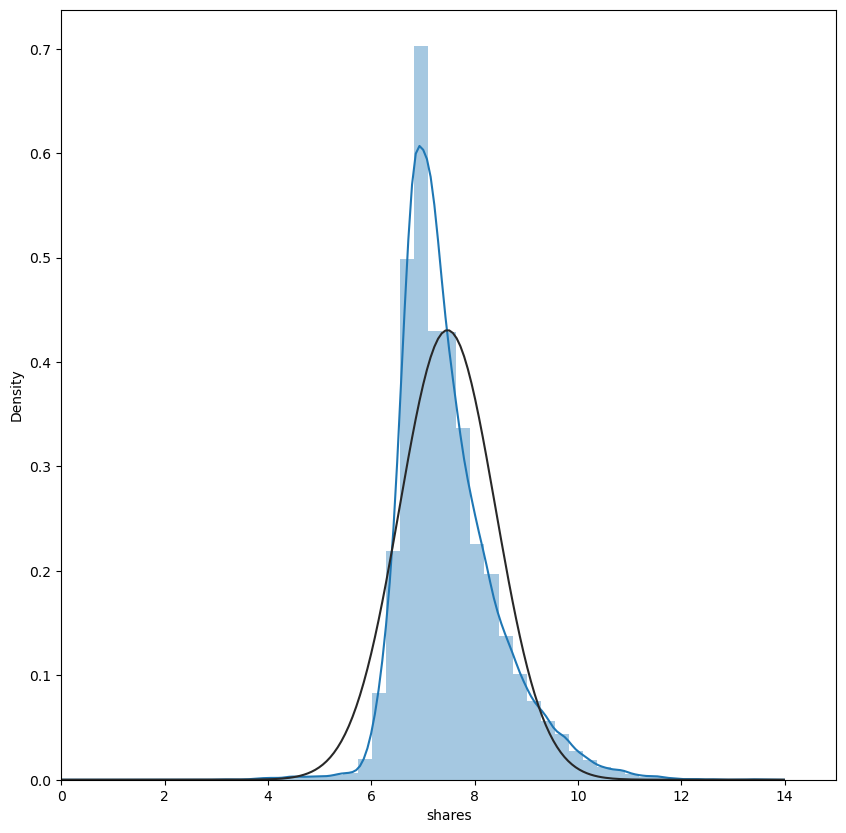

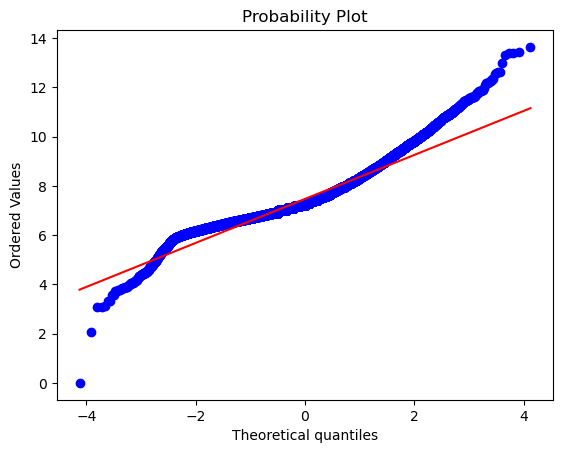

In [ ]:
new_shares_data = df_final.copy()

# Applying the log transformation
new_shares_data.loc[new_shares_data['shares'] > 0, 'shares'] = np.log(df_final.loc[df_final['shares'] > 0, 'shares'])
new_shares_log = new_shares_data['shares']

# Transformed histogram and normal probability plot
fig, ax = plt.subplots(figsize=(10,10))
sns.distplot(new_shares_log, fit=norm)
ax.set_xlim([0, 15])
plt.show()

# Probability plot
fig = plt.figure()
res = probplot(new_shares_log, plot=plt)
plt.show()

Checking for missing data

In [ ]:
total = new_shares_data.isnull().sum().sort_values(ascending=False)
percent = (new_shares_data.isnull().sum()/new_shares_data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
n_tokens_title,0,0.0
weekday_is_thursday,0,0.0
min_positive_polarity_new,0,0.0
max_positive_polarity_new,0,0.0
avg_negative_polarity_new,0,0.0


As all the visualisation done we will drop the data channel, weekend, popularity columns

In [ ]:
df_final = df_final.drop(columns=['weekdays', 'data_channel', 'popularity'])

# Feature Selection
- Variance Threshold
- PCA
- L1 Regularisation(Lasso)

Variance Threshold

In [ ]:
selector = VarianceThreshold(threshold=0.8)
selector.fit_transform(df_final)
high_var_features = df_final.columns[selector.get_support()].tolist()

In [ ]:
high_var_features

['n_tokens_title',
 'num_keywords',
 'kw_max_min_new',
 'kw_min_max_new',
 'kw_max_max_new',
 'kw_avg_max_new',
 'kw_min_avg_new',
 'kw_max_avg_new',
 'kw_avg_avg_new',
 'self_reference_min_shares_new',
 'self_reference_max_shares_new',
 'self_reference_avg_sharess_new',
 'max_negative_polarity_new',
 'shares']

L1 Regularisation(Lasso)

In [ ]:
X = df_final.drop(['shares'], axis=1)
y = df_final['shares']
lasso = Lasso(alpha=0.001)
lasso.fit(X, y)
lasso_coef = lasso.coef_
X_columns = df_final.columns.tolist()
# selected_features_lasso = [col for i, col in enumerate(X_columns) if lasso_coef[i] != 0]
selected_features_lasso = [col for i, col in enumerate(X_columns[:len(lasso_coef)]) if lasso_coef[i] != 0]


c:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.538e+12, tolerance: 5.133e+08
  model = cd_fast.enet_coordinate_descent(


In [ ]:
selected_features_lasso

['n_tokens_title',
 'n_tokens_content',
 'n_unique_tokens',
 'average_token_length',
 'num_keywords',
 'num_hrefs_new',
 'num_self_hrefs_new',
 'num_imgs_new',
 'num_videos_new',
 'kw_min_min_new',
 'kw_max_min_new',
 'kw_min_max_new',
 'kw_max_max_new',
 'kw_avg_max_new',
 'kw_min_avg_new',
 'kw_max_avg_new',
 'kw_avg_avg_new',
 'self_reference_min_shares_new',
 'self_reference_max_shares_new',
 'self_reference_avg_sharess_new',
 'LDA_00_new',
 'LDA_01_new',
 'LDA_02_new',
 'LDA_03_new',
 'LDA_04_new',
 'global_subjectivity_new',
 'global_sentiment_polarity_new',
 'global_rate_positive_words_new',
 'global_rate_negative_words_new',
 'rate_positive_words_new',
 'rate_negative_words_new',
 'avg_positive_polarity_new',
 'min_positive_polarity_new',
 'max_positive_polarity_new',
 'avg_negative_polarity_new',
 'min_negative_polarity_new',
 'max_negative_polarity_new',
 'title_subjectivity_new',
 'title_sentiment_polarity_new',
 'abs_title_subjectivity_new',
 'abs_title_sentiment_polarity_n

PCA

In [ ]:
X = df_final.drop(['shares'], axis=1)
y = df_final['shares']
X_train_PCA, X_test_PCA, y_train_PCA, y_test_PCA = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_PCA)  # Fit on training set only.
X_test_scaled = scaler.transform(X_test_PCA)

In [ ]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [ ]:
explained_variance = pca.explained_variance_ratio_

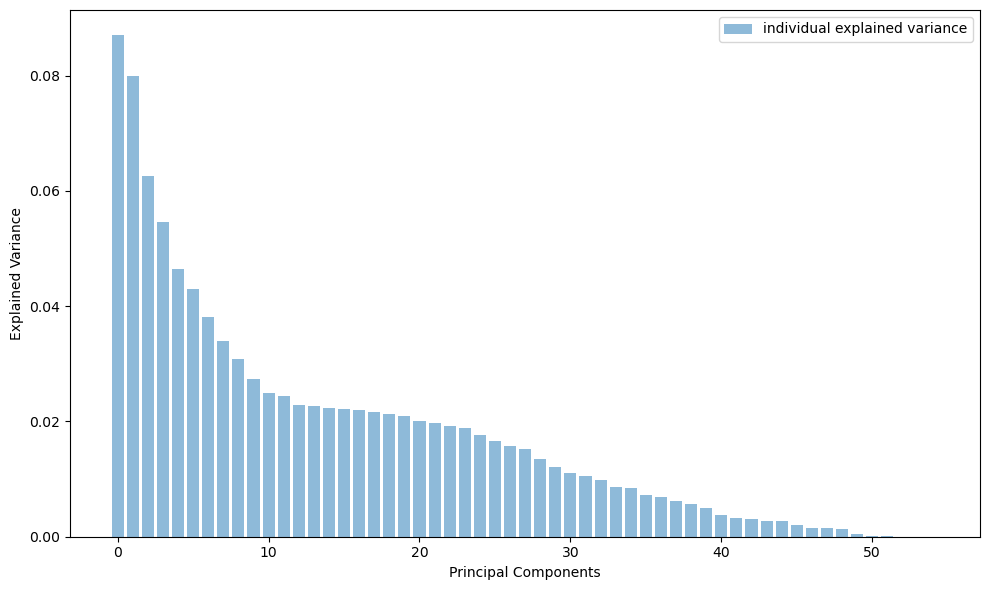

In [ ]:
# Plot the explained variance
plt.figure(figsize=(10, 6))
plt.bar(range(len(explained_variance)), explained_variance, alpha=0.5, align='center', label='individual explained variance')
plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')
plt.legend(loc='best')
plt.tight_layout()

In [ ]:
# Decide the number of components; for example, you might want to keep enough components
# that capture, say, 95% of the variance
cumulative_variance = explained_variance.cumsum()
num_components = (cumulative_variance <= 0.95).sum()

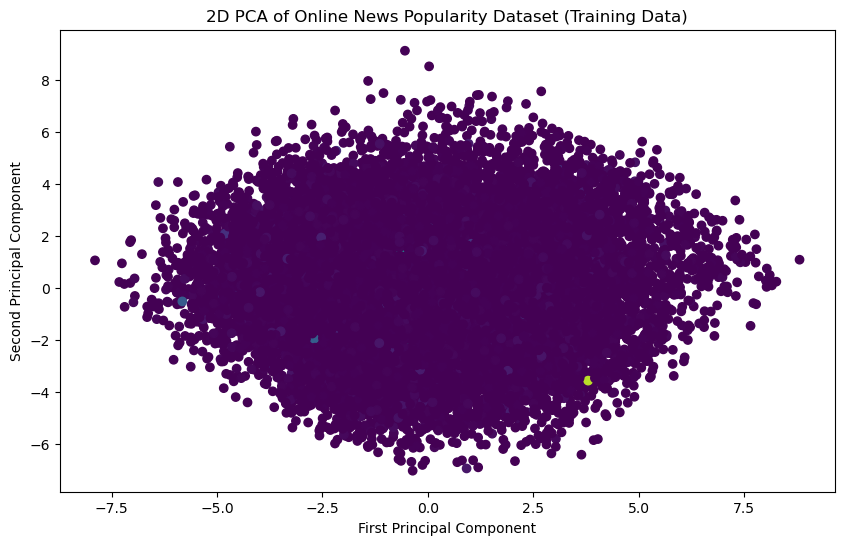

In [ ]:
if X_train_pca.shape[1] >= 2:
    plt.figure(figsize=(10, 6))
    plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train_PCA)  # coloring by target variable for training data
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.title('2D PCA of Online News Popularity Dataset (Training Data)')
    plt.show()

In [ ]:
X_train_pca_reduced = X_train_pca[:, :num_components]
X_test_pca_reduced = X_test_pca[:, :num_components]  # <-- for test data

In [ ]:
# Get the feature names from the original dataset
feature_names = X.columns

# Display the feature loadings for each principal component
for i, component in enumerate(pca.components_):
    component_df = pd.DataFrame({'Feature': feature_names, f'PC{i+1}': component})
    print(component_df.sort_values(by=f'PC{i+1}', key=abs, ascending=False))
    print("\n" + "-"*50 + "\n")


                             Feature       PC1
30           rate_negative_words_new -0.266848
29           rate_positive_words_new  0.266503
16                    kw_avg_avg_new -0.260886
28    global_rate_negative_words_new -0.248868
35         min_negative_polarity_new  0.248819
13                    kw_avg_max_new -0.239694
34         avg_negative_polarity_new  0.237811
18     self_reference_max_shares_new -0.237290
19    self_reference_avg_sharess_new -0.236867
12                    kw_max_max_new -0.209310
9                     kw_min_min_new  0.208495
17     self_reference_min_shares_new -0.207287
26     global_sentiment_polarity_new  0.205098
15                    kw_max_avg_new -0.198652
23                        LDA_03_new -0.185055
11                    kw_min_max_new -0.165461
14                    kw_min_avg_new -0.158930
7                       num_imgs_new -0.134138
6                 num_self_hrefs_new -0.132150
8                     num_videos_new -0.123700
24           

# Test Train Split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_lasso = df_final[selected_features_lasso]
X_high_var = df_final[high_var_features]

y = df_final['shares']


In [ ]:
print(X_lasso.shape)
print(X_high_var.shape)
print(y.shape)


(37408, 55)
(37408, 14)
(37408,)


In [ ]:
# Perform the test-train split for Lasso selected features
X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso = train_test_split(X_lasso, y, test_size=0.2, random_state=42)

# Perform the test-train split for high variance features
X_train_high_var, X_test_high_var, y_train_high_var, y_test_high_var = train_test_split(X_high_var, y, test_size=0.2, random_state=42)

# Regression Model Training and Testing

<h3>Linear Regression

In [ ]:
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
mse_LR = mean_squared_error(y_test, y_pred, squared=False)
r2_LR = r2_score(y_test, y_pred)

print(f'Linear Regression RMSE: {mse_LR}')
print(f'Linear Regression R2: {r2_LR}')

Linear Regression RMSE: 14518.23168257669
Linear Regression R2: -0.00012623232332376055


In [ ]:
lin_reg = LinearRegression()

# Train on Lasso selected features
lin_reg.fit(X_train_lasso, y_train_lasso)
predictions_lasso = lin_reg.predict(X_test_lasso)

# Train on high variance features
lin_reg.fit(X_train_high_var, y_train_high_var)
predictions_high_var = lin_reg.predict(X_test_high_var)

In [ ]:
# Performance on Lasso selected features
rmse_lasso_LR = mean_squared_error(y_test_lasso, predictions_lasso, squared=False)
r2_lasso_LR = r2_score(y_test_lasso, predictions_lasso)

print("Performance using Lasso selected features:")
print("RMSE:", rmse_lasso_LR)
print("R2 Score:", r2_lasso_LR)

# Performance on high variance features
rmse_high_var_LR = mean_squared_error(y_test_high_var, predictions_high_var, squared=False)
r2_high_var_LR = r2_score(y_test_high_var, predictions_high_var)

print("\nPerformance using high variance features:")
print("RMSE:", rmse_high_var_LR)
print("R2 Score:", r2_high_var_LR)

Performance using Lasso selected features:
RMSE: 14518.23168257669
R2 Score: -0.00012623232332376055

Performance using high variance features:
RMSE: 2.3614698096946007e-06
R2 Score: 1.0


In [ ]:
lr = LinearRegression()

# Fitting the model to the PCA transformed training data
lr.fit(X_train_pca_reduced, y_train)

# Making predictions
y_train_pred = lr.predict(X_train_pca_reduced)
y_test_pred = lr.predict(X_test_pca_reduced)

# Calculating the RMSE and R^2 values
rmse_train_PCA_LR = mean_squared_error(y_train, y_train_pred, squared=False)
r2_train_PCA_LR = r2_score(y_train, y_train_pred)

rmse_test_PCA_LR = mean_squared_error(y_test, y_test_pred, squared=False)
r2_test_PCA_LR = r2_score(y_test, y_test_pred)

print(f"Training RMSE: {rmse_train_PCA_LR:.4f}")
print(f"Training R^2: {r2_train_PCA_LR:.4f}")

print(f"Test RMSE: {rmse_test_PCA_LR:.4f}")
print(f"Test R^2: {r2_test_PCA_LR:.4f}")

Training RMSE: 10884.2518
Training R^2: 0.0032
Test RMSE: 14509.5773
Test R^2: 0.0011


<h3>Decision Tree Regressor

In [ ]:
tree = DecisionTreeRegressor(max_depth=10)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)

mse_DTR = mean_squared_error(y_test, y_pred, squared=False)
r2_DTR = r2_score(y_test, y_pred)

print(f'Decision Tree MSE: {mse_DTR}')
print(f'Decision Tree R^2: {r2_DTR}')

Decision Tree MSE: 18984.29305481271
Decision Tree R^2: -0.7100792290036158


In [ ]:
tree.fit(X_train_lasso, y_train_lasso)

y_pred = tree.predict(X_test_lasso)

mse_L1_DTR = mean_squared_error(y_test_lasso, y_pred, squared=False)
r2_L1_DTR = r2_score(y_test_lasso, y_pred)

print(f'Decision Tree RMSE (L1 Regularisation): {mse_L1_DTR}')
print(f'Decision Tree R^2 (L1 Regularisation): {r2_L1_DTR}')

tree.fit(X_train_high_var, y_train_high_var)

y_pred = tree.predict(X_test_high_var)

mse_VT_DTR = mean_squared_error(y_test_high_var, y_pred, squared=False)
r2_VT_DTR = r2_score(y_test_high_var, y_pred)

print(f'Decision Tree RMSE (Variance Threshold): {mse_VT_DTR}')
print(f'Decision Tree R^2 (Variance Threshold): {r2_VT_DTR}')

Decision Tree RMSE (L1 Regularisation): 17154.504351501633
Decision Tree R^2 (L1 Regularisation): -0.3963160245640336
Decision Tree RMSE (Variance Threshold): 2169.044528590226
Decision Tree R^2 (Variance Threshold): 0.9776763960530509


In [ ]:
tree.fit(X_train_pca_reduced, y_train)  # Use PCA-transformed training data

y_pred = tree.predict(X_test_pca_reduced)  # Use PCA-transformed test data

mse_PCA_DTR = mean_squared_error(y_test, y_pred, squared=False)
r2_PCA_DTR = r2_score(y_test, y_pred)

print(f'Decision Tree RMSE: {mse_PCA_DTR}')
print(f'Decision Tree R^2: {r2_PCA_DTR}')

Decision Tree RMSE: 18376.21504777585
Decision Tree R^2: -0.6022840238363896


<h3>Random Forest Regressor

In [ ]:
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
mse_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_RFR = r2_score(y_test, y_pred)
print(f'Random Forest RMSE: {mse_RFR}')
print(f'Random Forest R^2: {r2_RFR}')

Random Forest RMSE: 15020.14348479644
Random Forest R^2: -0.07047255236155481


In [ ]:
rf.fit(X_train_lasso, y_train_lasso)

y_pred = rf.predict(X_test_lasso)

mse_L1_RFR = mean_squared_error(y_test_lasso, y_pred, squared=False)
r2_L1_RFR = r2_score(y_test_lasso, y_pred)

print(f'Random Forest RMSE (L1 Regularisation): {mse_L1_RFR}')
print(f'Random Forest R^2 (L1 Regularisation): {r2_L1_RFR}')

rf.fit(X_train_high_var, y_train_high_var)

y_pred = rf.predict(X_test_high_var)

mse_VT_RFR = mean_squared_error(y_test_high_var, y_pred, squared=False)
r2_VT_RFR = r2_score(y_test_high_var, y_pred)

print(f'Random Forest RMSE (Variance Threshold): {mse_VT_RFR}')
print(f'Random Forest R^2 (Variance Threshold): {r2_VT_RFR}')

Random Forest RMSE (L1 Regularisation): 15020.14348479644
Random Forest R^2 (L1 Regularisation): -0.07047255236155481
Random Forest RMSE (Variance Threshold): 2692.7241072324605
Random Forest R^2 (Variance Threshold): 0.9655958295787014


In [ ]:
rf.fit(X_train_pca_reduced, y_train)

y_pred = rf.predict(X_test_pca_reduced)
mse_PCA_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_PCA_RFR = r2_score(y_test, y_pred)
print(f'Random Forest RMSE using PCA: {mse_PCA_RFR}')
print(f'Random Forest R^2 using PCA: {r2_PCA_RFR}')

Random Forest RMSE using PCA: 14825.908797507253
Random Forest R^2 using PCA: -0.042965689675518615


<h3>ADABoost

In [ ]:
tree = DecisionTreeRegressor(max_depth=4)
reg_lasso = AdaBoostRegressor(base_estimator=tree, n_estimators=100, random_state=42)
reg_lasso.fit(X_train_lasso, y_train_lasso)

# Predicting and evaluating
y_pred_lasso = reg_lasso.predict(X_test_lasso)
mse_lasso = mean_squared_error(y_test_lasso, y_pred_lasso, squared=False)  # squared=False for RMSE
r2_lasso = r2_score(y_test_lasso, y_pred_lasso)

print(f'[Lasso Features] Root Mean Squared Error: {mse_lasso}')
print(f'[Lasso Features] R^2 Score: {r2_lasso}')

[Lasso Features] Root Mean Squared Error: 27008.546440311045
[Lasso Features] R^2 Score: -2.461224720071828


In [ ]:
# Training on high variance-selected features
reg_high_var = AdaBoostRegressor(base_estimator=tree, n_estimators=100, random_state=42)
reg_high_var.fit(X_train_high_var, y_train_high_var)

# Predicting and evaluating
y_pred_high_var = reg_high_var.predict(X_test_high_var)
mse_high_var = mean_squared_error(y_test_high_var, y_pred_high_var, squared=False)
r2_high_var = r2_score(y_test_high_var, y_pred_high_var)

print(f'[High Variance Features] Root Mean Squared Error: {mse_high_var}')
print(f'[High Variance Features] R^2 Score: {r2_high_var}')

[High Variance Features] Root Mean Squared Error: 2402.6371022818807
[High Variance Features] R^2 Score: 0.972609262117772


In [ ]:
rf = RandomForestRegressor(n_estimators=50, random_state=42)

# AdaBoost
reg = AdaBoostRegressor(base_estimator=rf, n_estimators=10, random_state=42)
reg.fit(X_train_high_var, y_train_high_var)
y_pred = reg.predict(X_test_high_var)

# Calculate RMSE and R2
rmse_VT_ADA = np.sqrt(mean_squared_error(y_test_high_var, y_pred))
r2_VT_ADA = r2_score(y_test_high_var, y_pred)

print(f'Root Mean Squared Error (RMSE): {rmse_VT_ADA}')
print(f'R^2 Score: {r2_VT_ADA}')

Root Mean Squared Error (RMSE): 2002.5591270740113
R^2 Score: 0.9809717841640258


In [ ]:
# AdaBoost
reg = AdaBoostRegressor(base_estimator=rf, n_estimators=10, random_state=42)
reg.fit(X_train_lasso, y_train_lasso)
y_pred = reg.predict(X_test_lasso)

# Calculate RMSE and R2
rmse = np.sqrt(mean_squared_error(y_test_lasso, y_pred))
r2 = r2_score(y_test_lasso, y_pred)

print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R^2 Score: {r2}')

Root Mean Squared Error (RMSE): 14645.378399417395
R^2 Score: -0.017720605810221057


In [ ]:
results = pd.DataFrame({
    'Model': ['Linear Regression', 'Linear Regression', 'Linear Regression', 'Linear Regression', "Decision Tree Regressor", "Decision Tree Regressor", "Decision Tree Regressor", "Decision Tree Regressor", "Random Forest Regressor", "Random Forest Regressor", "Random Forest Regressor", "Random Forest Regressor", "ADABoost (Decision Tree Regressor)", "ADABoost (Decision Tree Regressor)", "ADABoost (Random Forest Regressor)", "ADABoost (Random Forest Regressor)",],
    'Technique': ['Basic', 'Lasso', 'High Variance', "PCA", 'Basic', 'Lasso', 'High Variance', "PCA", 'Basic', 'Lasso', 'High Variance', "PCA",  'Lasso', 'High Variance', 'High Variance' , 'Lasso'],
    'RMSE': [mse_LR, rmse_lasso_LR, rmse_high_var_LR, rmse_test_PCA_LR, mse_DTR, mse_L1_DTR, mse_VT_DTR, mse_PCA_DTR, mse_RFR, mse_L1_RFR, mse_VT_RFR, mse_PCA_RFR, mse_lasso, mse_high_var, rmse_VT_ADA, rmse],
    'R^2': [r2_LR, r2_lasso_LR, r2_high_var_LR, r2_test_PCA_LR, r2_DTR, r2_L1_DTR, r2_VT_DTR, r2_PCA_DTR, r2_RFR, r2_L1_RFR, r2_VT_RFR, r2_PCA_RFR, r2_lasso, r2_high_var, r2_VT_ADA, r2]
})

# Sort values by RMSE for better visualization
results = results.sort_values(by='RMSE', ascending=False)
print(results)


                                 Model      Technique          RMSE       R^2
12  ADABoost (Decision Tree Regressor)          Lasso  27008.546440 -2.461225
4              Decision Tree Regressor          Basic  18984.293055 -0.710079
7              Decision Tree Regressor            PCA  18376.215048 -0.602284
5              Decision Tree Regressor          Lasso  17154.504352 -0.396316
8              Random Forest Regressor          Basic  15020.143485 -0.070473
9              Random Forest Regressor          Lasso  15020.143485 -0.070473
11             Random Forest Regressor            PCA  14825.908798 -0.042966
15  ADABoost (Random Forest Regressor)          Lasso  14645.378399 -0.017721
0                    Linear Regression          Basic  14518.231683 -0.000126
1                    Linear Regression          Lasso  14518.231683 -0.000126
3                    Linear Regression            PCA  14509.577331  0.001066
10             Random Forest Regressor  High Variance   2692.724

In [ ]:
# Sort results DataFrame by R2 in descending order
sorted_results = results.sort_values(by='R^2', ascending=False)

# Print the sorted results in tabulated format
print(tabulate(sorted_results, headers='keys', tablefmt='grid'))

+----+------------------------------------+---------------+-----------------+--------------+
|    | Model                              | Technique     |            RMSE |          R^2 |
+====+====================================+===============+=================+==============+
|  2 | Linear Regression                  | High Variance |     2.36147e-06 |  1           |
+----+------------------------------------+---------------+-----------------+--------------+
| 14 | ADABoost (Random Forest Regressor) | High Variance |  2002.56        |  0.980972    |
+----+------------------------------------+---------------+-----------------+--------------+
|  6 | Decision Tree Regressor            | High Variance |  2169.04        |  0.977676    |
+----+------------------------------------+---------------+-----------------+--------------+
| 13 | ADABoost (Decision Tree Regressor) | High Variance |  2402.64        |  0.972609    |
+----+------------------------------------+---------------+-----------

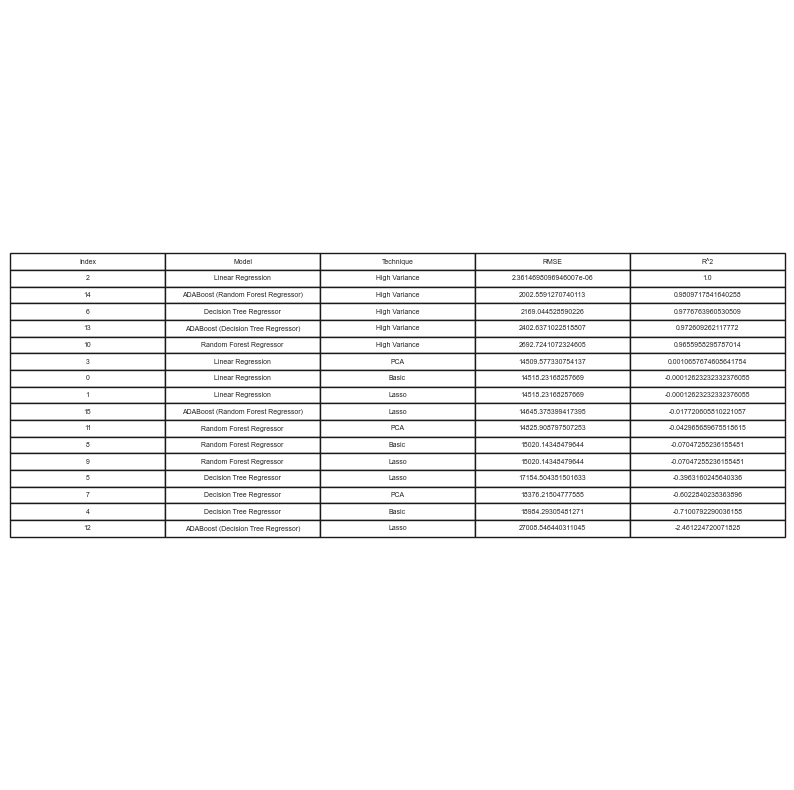

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10)) # set the size that you'd like (width, height)
ax.axis('off')  # Turn off axis
ax.axis('tight')  # Fit table in the plot

# Display table data
table_data = []
columns = sorted_results.columns.insert(0, "Index")
table_data.append(columns)
for index, row in sorted_results.iterrows():
    table_data.append([index] + row.tolist())

ax.table(cellText=table_data, colLabels=None, cellLoc = 'center', loc='center')

plt.show()

# Hyperparameter Tuning

Here we will try to tune some of the best results using Grid Search, Random Search and Cross validation

For Decision tree Regressor using Grid Search

In [ ]:
# For Variance threshold
tree_params = {
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

tree_search = GridSearchCV(DecisionTreeRegressor(), tree_params, cv=5, scoring='neg_mean_squared_error')
tree_search.fit(X_train_high_var, y_train_high_var)
print("Best parameters for Decision Tree:", tree_search.best_params_)

Best parameters for Decision Tree: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5}


In [ ]:
tree = DecisionTreeRegressor(max_depth=None, min_samples_leaf=1, min_samples_split=5)
tree.fit(X_train_high_var, y_train)

y_pred = tree.predict(X_test_high_var)

mse_VT_DTR_GS2 = mean_squared_error(y_test, y_pred, squared=False)
r2_VT_DTR_GS2 = r2_score(y_test, y_pred)

print(f'Decision Tree MSE (Variance Threshold): {mse_VT_DTR_GS2}')
print(f'Decision Tree R^2 (Variance Threshold): {r2_VT_DTR_GS2}')

Decision Tree MSE (Variance Threshold): 2866.0980625515986
Decision Tree R^2 (Variance Threshold): 0.9610229052862485


For Random Forest Regressor using Random Search

In [ ]:
# Variance Threshold
rf_dist = {
    'n_estimators': randint(10, 200),
    'max_depth': [None] + list(randint(1, 20).rvs(10)),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10)
}
rf_search = RandomizedSearchCV(RandomForestRegressor(), param_distributions=rf_dist,
                               n_iter=50, scoring='neg_mean_squared_error',
                               n_jobs=-1, cv=5, random_state=42)
rf_search.fit(X_train_high_var, y_train)
print("Best parameters for Random Forest:", rf_search.best_params_)

Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 61}


In [ ]:
rf = RandomForestRegressor(max_depth=None, min_samples_leaf=1, min_samples_split=3, n_estimators=61)

rf.fit(X_train_high_var, y_train)

y_pred = rf.predict(X_test_high_var)

mse_VT_RFR_RS2 = mean_squared_error(y_test, y_pred, squared=False)
r2_VT_RFR_RS2 = r2_score(y_test, y_pred)

print(f'Random Forest RMSE (Variance Threshold): {mse_VT_RFR_RS2}')
print(f'Random Forest R^2 (Variance Threshold): {r2_VT_RFR_RS2}')

Random Forest RMSE (Variance Threshold): 2874.378551368704
Random Forest R^2 (Variance Threshold): 0.9607973612748323


In [ ]:
results2 = pd.DataFrame({
    'Model': ["Decision Tree Regressor", "Decision Tree Regressor", "Random Forest Regressor",  "Random Forest Regressor"],
    'Technique': ['Original', 'Hyperparametrized', 'Original', 'Hyperparametrized'],
    'RMSE': [mse_VT_DTR, mse_VT_DTR_GS2, mse_VT_RFR, mse_VT_RFR_RS2],
    'R^2': [r2_VT_DTR, r2_VT_DTR_GS2, r2_VT_RFR, r2_VT_RFR_RS2]
})

# Sort values by RMSE for better visualization
results2 = results2.sort_values(by='RMSE', ascending=False)
print(results2)

                     Model          Technique         RMSE       R^2
3  Random Forest Regressor  Hyperparametrized  2874.378551  0.960797
1  Decision Tree Regressor  Hyperparametrized  2866.098063  0.961023
2  Random Forest Regressor           Original  2692.724107  0.965596
0  Decision Tree Regressor           Original  2169.044529  0.977676


In [ ]:
# Sort results DataFrame by R2 in descending order
sorted_results2 = results2.sort_values(by='R^2', ascending=False)

# Print the sorted results in tabulated format
print(tabulate(sorted_results2, headers='keys', tablefmt='grid'))

+----+-------------------------+-------------------+---------+----------+
|    | Model                   | Technique         |    RMSE |      R^2 |
+====+=========================+===================+=========+==========+
|  0 | Decision Tree Regressor | Original          | 2169.04 | 0.977676 |
+----+-------------------------+-------------------+---------+----------+
|  2 | Random Forest Regressor | Original          | 2692.72 | 0.965596 |
+----+-------------------------+-------------------+---------+----------+
|  1 | Decision Tree Regressor | Hyperparametrized | 2866.1  | 0.961023 |
+----+-------------------------+-------------------+---------+----------+
|  3 | Random Forest Regressor | Hyperparametrized | 2874.38 | 0.960797 |
+----+-------------------------+-------------------+---------+----------+


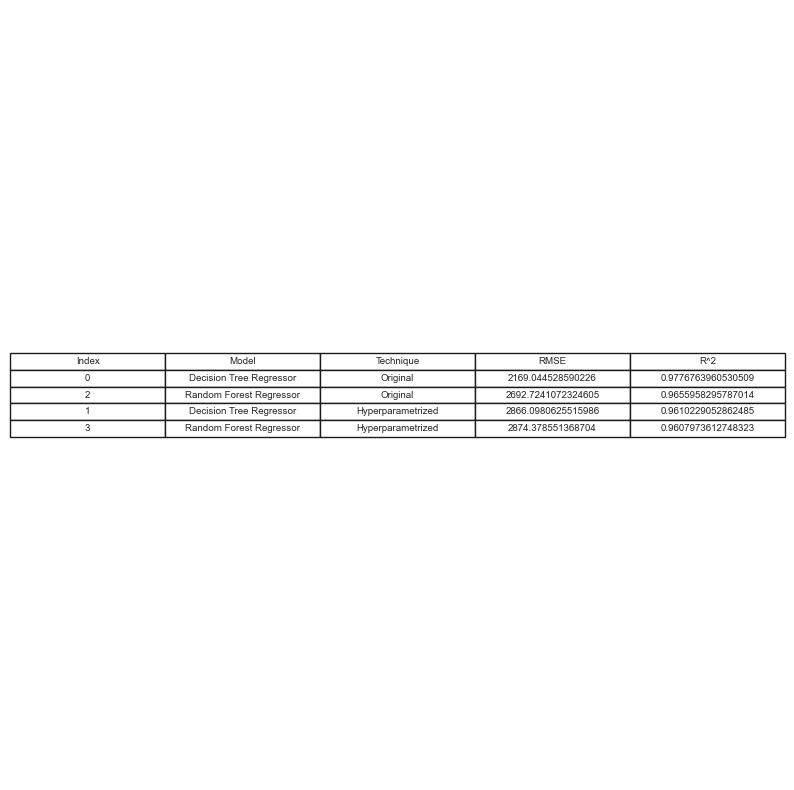

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10)) # set the size that you'd like (width, height)
ax.axis('off')  # Turn off axis
ax.axis('tight')  # Fit table in the plot

# Display table data
table_data = []
columns = sorted_results2.columns.insert(0, "Index")
table_data.append(columns)
for index, row in sorted_results2.iterrows():
    table_data.append([index] + row.tolist())

ax.table(cellText=table_data, colLabels=None, cellLoc = 'center', loc='center')

plt.show()